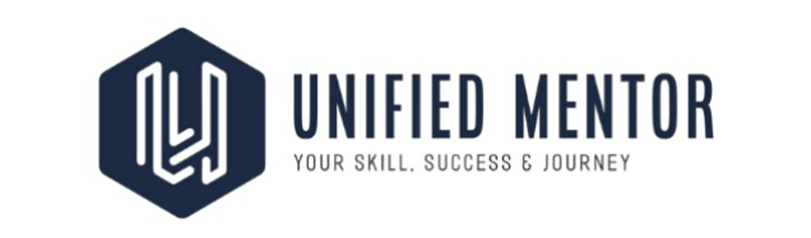

# **UBER TRIP ANALYSIS**

#### IMPORTING necessary Python Libraries and Files

In [1]:
# !pip install scikit-learn
# pip install xgboost
# pip install --upgrade scikit-learn xgboost
# pip install statsmodels
# pip install mplcursors
# !pip install folium

In [3]:
import warnings  # To handle and suppress warnings
warnings.filterwarnings("ignore")  # Ignore warnings to keep the output clean

import os      # To interact with the operating system (e.g., file paths)
import numpy as np     # For numerical operations and array handling
import pandas as pd     # For data manipulation and analysis
import seaborn as sns     # For advanced data visualization (based on Matplotlib)
import xgboost as xgb       # For XGBoost machine learning models (gradient boosting)
import matplotlib.pyplot as plt     # For basic plotting and data visualization
import mplcursors    #to hover the cursor
import folium     # to plot the map visuals

from sklearn.model_selection import KFold        # For splitting data into k-folds for cross-validation
from sklearn.model_selection import train_test_split      # For splitting data into training and testing sets
from sklearn.metrics import mean_absolute_percentage_error      # To calculate error metric for regression tasks
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor        # For ensemble regression models
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, TimeSeriesSplit        # For hyperparameter tuning and cross-validation

from xgboost import plot_importance, plot_tree       # To visualize XGBoost model importance and decision trees
from statsmodels.tsa.seasonal import seasonal_decompose      # For time series seasonal decomposition


**Reading all CSV files and Load it into a DataFrame**

In [4]:
Uber_Jan_Feb_FOIL = pd.read_csv("Uber-Jan-Feb-FOIL.csv")
Uber_Jan_Feb_FOIL

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537
...,...,...,...,...
349,B02764,2/28/2015,3952,39812
350,B02617,2/28/2015,1372,14022
351,B02682,2/28/2015,1386,14472
352,B02512,2/28/2015,230,1803


In [5]:
other_American_B01362 = pd.read_csv("other-American_B01362.csv")
other_American_B01362

,DATE,TIME,PICK UP ADDRESS,Unnamed: 3,Unnamed: 4,Unnamed: 5
0,7/1/2014,12:00:00 AM,"874 E 139th St Mott Haven, BX",NaN,NaN,NaN
1,7/1/2014,12:01:00 AM,"628 E 141st St Mott Haven, BX",NaN,NaN,NaN
2,7/1/2014,12:01:00 AM,"601 E 156th St South Bronx, BX",NaN,NaN,NaN
3,7/1/2014,12:01:00 AM,"708 E 138th St Mott Haven, BX",NaN,NaN,NaN
4,7/1/2014,12:02:00 AM,"700 E 140th St Mott Haven, BX",NaN,NaN,NaN
...,...,...,...,...,...,...
91707,9/30/2014,11:47:00 PM,"593 Oak Ter Mott Haven, BX",NaN,NaN,NaN
91708,9/30/2014,11:48:00 PM,"645 Westchester Ave South Bronx, BX",NaN,NaN,NaN
91709,9/30/2014,11:51:00 PM,"625 Tinton Ave South Bronx, BX",NaN,NaN,NaN
91710,9/30/2014,11:54:00 PM,"350 Saint Anns Ave Mott Haven, BX",NaN,NaN,NaN


**I use this `encoding='ISO-8859-1'` for some file and this specifies the character encoding to be used when reading a file, ensuring proper handling of non-UTF-8 characters (such as special symbols or accented letters).**

In [6]:
#in this file if we don't used encoding ="ISO-8859-1" it throws UnicodeDecodeError
other_Carmel_B00256 = pd.read_csv("other-Carmel_B00256.csv", encoding='ISO-8859-1')
other_Carmel_B00256


,Date,Time,PU_Adress,Base_No
0,7/1/2014,0:00,260 W 44 St NYC,B00256
1,7/1/2014,0:00,125 W 29 St Nyc,B00256
2,7/1/2014,0:00,141 W 28 St Nyc,B00256
3,7/1/2014,0:01,EWR,B00256
4,7/1/2014,0:07,JFK,B00256
...,...,...,...,...
256514,9/30/2014,23:53,JFK,B00256
256515,9/30/2014,23:55,5 Allen St Nyc,B00256
256516,9/30/2014,23:56,JFK,B00256
256517,9/30/2014,23:58,EWR,B00256


In [7]:
other_Dial7_B00887 = pd.read_csv("other-Dial7_B00887.csv")
other_Dial7_B00887

,Date,Time,State,PuFrom,Address,Street
0,2014.07.06,14:30,NY ...,MANHATTAN,50,MURRAY ST
1,2014.07.04,7:15,NY ...,MANHATTAN,143,AVENUE B
2,2014.07.05,5:45,NY ...,MANHATTAN,125,CHRISTOPHER ST
3,2014.07.06,4:30,NY ...,MANHATTAN,217,E 7 ST
4,2014.07.05,7:45,NY ...,MANHATTAN,521,W 26 ST
...,...,...,...,...,...,...
194987,2014.09.28,21:50,JFK DELTA TERM 4 P/U AREA C ...,Jfk,,
194988,2014.09.28,7:00,NY ...,MANHATTAN,112,W 78 ST
194989,2014.09.28,15:30,NY ...,MANHATTAN,601,W 57 ST
194990,2014.09.28,19:55,JFK DELTA TERM 2 CURBSIDE ...,NaN,,


In [8]:
other_Diplo_B01196 = pd.read_csv("other-Diplo_B01196.csv",encoding='ISO-8859-1')
other_Diplo_B01196

,Date,Time,PU_Address
0,7/1/2014,12:00:00 AM,"2396 Valentine Ave Fordham, BX"
1,7/1/2014,12:01:00 AM,"1859 Walton Ave Morris Heights, BX"
2,7/1/2014,12:02:00 AM,"2431 Jerome Ave Jerome, BX"
3,7/1/2014,12:05:00 AM,"3044 Valentine Ave Fordham, BX"
4,7/1/2014,12:05:00 AM,"1085 Nelson Ave High Bridge, BX"
...,...,...,...
98545,9/30/2014,11:54:00 PM,"2847 Webb Ave Jerome, BX"
98546,9/30/2014,11:56:00 PM,"*-BASE-* 170 W Fordham Rd Jerome, BX"
98547,9/30/2014,11:57:00 PM,"*-BASE-* 170 W Fordham Rd Jerome, BX"
98548,9/30/2014,11:57:00 PM,"*-BASE-* 170 W Fordham Rd Jerome, BX"


In [142]:
other_FHV_services_jan_aug_2015 = pd.read_csv("other-FHV-services_jan-aug-2015.csv")
other_FHV_services_jan_aug_2015

,Base Number,Base Name,Pick Up Date,Number of Trips,Number of Vehicles
0,B00013,LOVE CORP CAR INC,01/01/2015,26,17
1,B00014,NY ONE CORP CAR INC,01/01/2015,45,24
2,B00029,COMMUNITY CAR SVC CORP,01/01/2015,731,36
3,B00053,CHARGE AND RIDE INC,01/01/2015,10,9
4,B00095,LIBERTY CAR SERVICE INC.,01/01/2015,814,62
...,...,...,...,...,...
26176,B02666,"D.L.C. LIMOUSINE SERVICE, INC.",08/30/2015,4,3
26177,B01313,JOY CAR SERVICES INC.,08/31/2015,14,14
26178,B01509,"BRUNWISH ENTERPRISES,LTD.",08/31/2015,736,63
26179,B01614,R TRANSPORT INC,08/31/2015,45,8


In [143]:
other_Federal_02216 = pd.read_csv("other-Federal_02216.csv")
other_Federal_02216

,Date,Time,PU_Address,DO_Address,Routing Details,PU_Address.1,Status
0,07/01/2014,07:15 AM,"Brooklyn Museum, 200 Eastern Pkwy., BK NY;","1 Brookdale Plaza, BK NY;","PU: Brooklyn Museum, 200 Eastern Pkwy., BK NY;...","Brooklyn Museum, 200 Eastern Pkwy., BK NY; DO:...",Cancelled
1,07/01/2014,07:30 AM,"33 Robert Dr., Short Hills NJ;","John F Kennedy International Airport, vitona A...","PU: 33 Robert Dr., Short Hills NJ; DO: John F ...","33 Robert Dr., Short Hills NJ; DO: John F Kenn...",Arrived
2,07/01/2014,08:00 AM,"60 Glenmore Ave., BK NY;","2171 Nostrand Ave., BK NY;","PU: 60 Glenmore Ave., BK NY; DO: 2171 Nostrand...","60 Glenmore Ave., BK NY; DO: 2171 Nostrand Ave...",Assigned
3,07/01/2014,09:00 AM,"128 East 31 St., BK NY;","369 93rd St., BK NY;","PU: 128 East 31 St., BK NY; DO: 369 93rd St., ...","128 East 31 St., BK NY; DO: 369 93rd St., BK NY;",Assigned
4,07/01/2014,09:30 AM,"139-39 35 Ave., Flushing NY;",La Guardia Airport;,"PU: 139-39 35 Ave., Flushing NY; DO: La Guardi...","139-39 35 Ave., Flushing NY; DO: La Guardia Ai...",Assigned
...,...,...,...,...,...,...,...
271,09/25/2014,12:00 PM,"907 59 St., BK NY; ST: W66 St./Broadway, NY NY;",John F Kennedy International Airport;,"PU: 907 59 St., BK NY; ST: W66 St./Broadway, N...","907 59 St., BK NY; ST: W66 St./Broadway, NY NY...",Arrived
272,09/26/2014,04:00 PM,"20 West St., NY NY;",La Guardia Airport;,"PU: 20 West St., NY NY; DO: La Guardia Airport;","20 West St., NY NY; DO: La Guardia Airport;",Assigned
273,09/27/2014,05:00 AM,"474 Sackett Street, BK NY;","John F Kennedy International Airport, Virgin A...","PU: 474 Sackett Street, BK NY; DO: John F Kenn...","474 Sackett Street, BK NY; DO: John F Kennedy ...",Arrived
274,09/27/2014,08:00 AM,"474 Sackett Street, BK NY;","Newark Liberty International Airport, Virgin A...","PU: 474 Sackett Street, BK NY; DO: Newark Libe...","474 Sackett Street, BK NY; DO: Newark Liberty ...",Arrived


In [144]:
other_Firstclass_B01536 = pd.read_csv("other-Firstclass_B01536.csv",encoding = 'ISO-8859-1')
other_Firstclass_B01536

,DATE,TIME,PICK UP ADDRESS
0,7/1/2014,12:02:00 AM,"5360 Broadway Kingsbridge, BX"
1,7/1/2014,12:02:00 AM,546 Isham St NYC
2,7/1/2014,12:03:00 AM,234 Bradhurst Ave NYC
3,7/1/2014,12:07:00 AM,99 Marble Hill Ave Bronx
4,7/1/2014,12:08:00 AM,120 Vermilyea Ave NYC
...,...,...,...
166764,9/30/2014,11:52:00 PM,LINCOLN HOSPITAL MAIN 234 E 149th St Cortlandt...
166765,9/30/2014,11:53:00 PM,la bodega 2051 8 Ave NYC
166766,9/30/2014,11:56:00 PM,hess gas station nw 9 Ave NYC
166767,9/30/2014,11:58:00 PM,stop & shop supermarket 5716 Broadway Bronx


In [145]:
other_Highclass_B01717 = pd.read_csv("other-Highclass_B01717.csv",encoding = 'ISO-8859-1')
other_Highclass_B01717

,DATE,TIME,PU_Address
0,7/1/2014,12:00:00 AM,"2976 Marion Ave Fordham, BX"
1,7/1/2014,12:01:00 AM,"780 Grand Concourse Cortlandt, BX"
2,7/1/2014,12:01:00 AM,"105 Elliot Pl High Bridge, BX"
3,7/1/2014,12:03:00 AM,2825 Webb Ave Bronx
4,7/1/2014,12:04:00 AM,"1878 Cedar Ave Morris Heights, BX"
...,...,...,...
151920,9/30/2014,11:54:00 PM,"2247 Grand Ave Morris Heights, BX"
151921,9/30/2014,11:55:00 PM,320 Morris Ave Bronx
151922,9/30/2014,11:55:00 PM,"3105 Decatur Ave Williamsbridge, BX"
151923,9/30/2014,11:58:00 PM,"2125 Cruger Ave Parkchester, BX"


In [146]:
other_Lyft_B02510 = pd.read_csv("other-Lyft_B02510.csv")
other_Lyft_B02510

,time_of_trip,start_lat,start_lng,Unnamed: 3
0,9/4/2014 9:51,40.64705,-73.77988,NaN
1,8/27/2014 21:13,40.74916,-73.98373,NaN
2,9/4/2014 14:16,40.64065,-73.97594,NaN
3,9/4/2014 16:08,40.75002,-73.99514,NaN
4,8/28/2014 2:41,40.76715,-73.98636,NaN
...,...,...,...,...
267696,9/7/2014 3:19,40.71931,-73.99138,NaN
267697,9/7/2014 2:59,40.73868,-73.98862,NaN
267698,9/7/2014 1:55,40.71554,-73.94877,NaN
267699,9/5/2014 23:26,40.74667,-73.97445,NaN


In [147]:
other_Prestige_B01338 = pd.read_csv("other-Prestige_B01338.csv",encoding ="ISO-8859-1")
other_Prestige_B01338

,DATE,TIME,PICK UP ADDRESS
0,7/1/2014,12:00:00 AM,"2557 Marion Ave Fordham, BX"
1,7/1/2014,12:00:00 AM,"45 E Mosholu Pkwy N Williamsbridge, BX"
2,7/1/2014,12:00:00 AM,"458 E 143rd St Mott Haven, BX"
3,7/1/2014,12:02:00 AM,"MINIVAN SUV 2557 Marion Ave Fordham, BX"
4,7/1/2014,12:02:00 AM,"1117 Westchester Ave Foxhurst, BX"
...,...,...,...
320636,9/30/2014,11:59:00 PM,"2420 Williamsbridge Rd Baychester, BX"
320637,9/30/2014,11:59:00 PM,"2260 Washington Avenue, Bronx, NY, United 226..."
320638,9/30/2014,11:59:00 PM,"1009 Sackett Ave Parkchester, BX"
320639,9/30/2014,11:59:00 PM,"3163 Villa Ave Jerome, BX"


In [148]:
other_Skyline_B00111 = pd.read_csv("other-Skyline_B00111.csv")
other_Skyline_B00111

,Date,Time,Street_Address,City_State,Unnamed: 4,Unnamed: 5
0,7/1/2014,20:27,622 THIRD AV,M,NaN,NaN
1,7/1/2014,21:04,E 77TH ST,M,NaN,NaN
2,7/1/2014,22:20,67 WEST PALISADES BLVD,PALISADES PARK NJ,NaN,NaN
3,7/1/2014,12:28,130 MIDDLE NECK RD,SANDS POINT LI,NaN,NaN
4,7/1/2014,16:45,36 E 31ST ST,M,NaN,NaN
...,...,...,...,...,...,...
127691,9/29/2014,13:15,370 7th AVE,M,NaN,NaN
127692,9/29/2014,15:40,1 STATE ST PZ,M,NaN,NaN
127693,9/29/2014,20:07,730 5TH AVE,M,NaN,NaN
127694,9/29/2014,22:48,30 ROCKEFELLER PZ,M,NaN,NaN


In [149]:
uber_raw_data_apr14 = pd.read_csv("uber-raw-data-apr14.csv")
uber_raw_data_apr14

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
564511,4/30/2014 23:22:00,40.7640,-73.9744,B02764
564512,4/30/2014 23:26:00,40.7629,-73.9672,B02764
564513,4/30/2014 23:31:00,40.7443,-73.9889,B02764
564514,4/30/2014 23:32:00,40.6756,-73.9405,B02764


In [150]:
uber_raw_data_aug14 = pd.read_csv("uber-raw-data-aug14.csv")
uber_raw_data_aug14

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512
...,...,...,...,...
829270,8/31/2014 23:55:00,40.7552,-73.9753,B02764
829271,8/31/2014 23:55:00,40.7552,-73.9753,B02764
829272,8/31/2014 23:55:00,40.7617,-73.9788,B02764
829273,8/31/2014 23:59:00,40.7395,-73.9889,B02764


In [151]:
uber_raw_data_janjune_15 = pd.read_csv("uber-raw-data-janjune-15.csv")
uber_raw_data_janjune_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90
...,...,...,...,...
14270474,B02765,2015-05-08 15:43:00,B02765,186
14270475,B02765,2015-05-08 15:43:00,B02765,263
14270476,B02765,2015-05-08 15:43:00,B02765,90
14270477,B02765,2015-05-08 15:44:00,B01899,45


In [152]:
uber_raw_data_jul14 = pd.read_csv("uber-raw-data-jul14.csv")
uber_raw_data_jul14

,Date/Time,Lat,Lon,Base
0,7/1/2014 0:03:00,40.7586,-73.9706,B02512
1,7/1/2014 0:05:00,40.7605,-73.9994,B02512
2,7/1/2014 0:06:00,40.7320,-73.9999,B02512
3,7/1/2014 0:09:00,40.7635,-73.9793,B02512
4,7/1/2014 0:20:00,40.7204,-74.0047,B02512
...,...,...,...,...
796116,7/31/2014 23:22:00,40.7285,-73.9846,B02764
796117,7/31/2014 23:23:00,40.7615,-73.9868,B02764
796118,7/31/2014 23:29:00,40.6770,-73.9515,B02764
796119,7/31/2014 23:30:00,40.7225,-74.0038,B02764


In [153]:
uber_raw_data_jun14 = pd.read_csv("uber-raw-data-jun14.csv")
uber_raw_data_jun14

,Date/Time,Lat,Lon,Base
0,6/1/2014 0:00:00,40.7293,-73.9920,B02512
1,6/1/2014 0:01:00,40.7131,-74.0097,B02512
2,6/1/2014 0:04:00,40.3461,-74.6610,B02512
3,6/1/2014 0:04:00,40.7555,-73.9833,B02512
4,6/1/2014 0:07:00,40.6880,-74.1831,B02512
...,...,...,...,...
663839,6/30/2014 22:40:00,40.7332,-73.9872,B02764
663840,6/30/2014 23:12:00,40.7905,-73.9796,B02764
663841,6/30/2014 23:13:00,40.7640,-73.9887,B02764
663842,6/30/2014 23:15:00,40.7262,-73.9944,B02764


In [154]:
uber_raw_data_may14 = pd.read_csv("uber-raw-data-may14.csv")
uber_raw_data_may14

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512
...,...,...,...,...
652430,5/31/2014 23:45:00,40.7309,-74.0014,B02764
652431,5/31/2014 23:52:00,40.7528,-73.9798,B02764
652432,5/31/2014 23:55:00,40.7158,-73.9519,B02764
652433,5/31/2014 23:56:00,40.6961,-73.8997,B02764


In [155]:
uber_raw_data_sep14 = pd.read_csv("uber-raw-data-sep14.csv")
uber_raw_data_sep14

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512
...,...,...,...,...
1028131,9/30/2014 22:57:00,40.7668,-73.9845,B02764
1028132,9/30/2014 22:57:00,40.6911,-74.1773,B02764
1028133,9/30/2014 22:58:00,40.8519,-73.9319,B02764
1028134,9/30/2014 22:58:00,40.7081,-74.0066,B02764


**Performing Python Calculations, Statistics and Operations**

In [23]:
uber_raw_data_janjune_15.shape  #(rows,column)

(14270479, 4)

In [26]:
uber_raw_data_janjune_15.info   # it get all information of table.

<bound method DataFrame.info of          Dispatching_base_num          Pickup_date Affiliated_base_num  \
0                      B02617  2015-05-17 09:47:00              B02617   
1                      B02617  2015-05-17 09:47:00              B02617   
2                      B02617  2015-05-17 09:47:00              B02617   
3                      B02617  2015-05-17 09:47:00              B02774   
4                      B02617  2015-05-17 09:47:00              B02617   
...                       ...                  ...                 ...   
14270474               B02765  2015-05-08 15:43:00              B02765   
14270475               B02765  2015-05-08 15:43:00              B02765   
14270476               B02765  2015-05-08 15:43:00              B02765   
14270477               B02765  2015-05-08 15:44:00              B01899   
14270478               B02765  2015-05-08 15:44:00              B02682   

          locationID  
0                141  
1                 65  
2         

In [27]:
type(uber_raw_data_janjune_15) # type of table

pandas.core.frame.DataFrame

In [28]:
uber_raw_data_janjune_15.columns # it get all column names present in the table

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID'],
      dtype='object')

In [29]:
uber_raw_data_janjune_15.head(10)  # it get first 10 rows of table

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90
5,B02617,2015-05-17 09:47:00,B02617,228
6,B02617,2015-05-17 09:47:00,B02617,7
7,B02617,2015-05-17 09:47:00,B02764,74
8,B02617,2015-05-17 09:47:00,B02617,249
9,B02617,2015-05-17 09:47:00,B02764,22


In [30]:
uber_raw_data_janjune_15.tail(10)  # it get the 10 rows from the bottom

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
14270469,B02765,2015-05-08 15:42:00,B02764,79
14270470,B02765,2015-05-08 15:42:00,B02765,37
14270471,B02765,2015-05-08 15:42:00,B02765,161
14270472,B02765,2015-05-08 15:42:00,B02765,7
14270473,B02765,2015-05-08 15:43:00,B02711,25
14270474,B02765,2015-05-08 15:43:00,B02765,186
14270475,B02765,2015-05-08 15:43:00,B02765,263
14270476,B02765,2015-05-08 15:43:00,B02765,90
14270477,B02765,2015-05-08 15:44:00,B01899,45
14270478,B02765,2015-05-08 15:44:00,B02682,144


In [31]:
uber_raw_data_janjune_15.index  

RangeIndex(start=0, stop=14270479, step=1)

In [32]:
uber_raw_data_janjune_15.dtypes  # it get the data types of the table columns

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [33]:
uber_raw_data_janjune_15.describe() # it describes all the statistics operations

,locationID
count,1.427048e+07
mean,1.520574e+02
std,7.159620e+01
min,1.000000e+00
25%,9.200000e+01
50%,1.570000e+02
75%,2.300000e+02
max,2.650000e+02


In [34]:
uber_raw_data_janjune_15.isnull().sum()  # it get the null values of table

Dispatching_base_num         0
Pickup_date                  0
Affiliated_base_num     162195
locationID                   0
dtype: int64

# DATA CLEANING

**Performing on *Uber_Jan_Feb_FOIL* Table**

In [35]:
Uber_Jan_Feb_FOIL.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

In [37]:
Uber_Jan_Feb_FOIL.head()  # by default it get the first 5 rows

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [38]:
Uber_Jan_Feb_FOIL.isnull().sum()

dispatching_base_number    0
date                       0
active_vehicles            0
trips                      0
dtype: int64

In [39]:
Uber_Jan_Feb_FOIL.duplicated(subset=['dispatching_base_number']).sum() # it shows how much column has duplicted rows

np.int64(348)

In [40]:
Uber_Jan_Feb_FOIL.dropna(subset = 'dispatching_base_number',inplace = True) # it is used to drop the null value rows

In [42]:
Uber_Jan_Feb_FOIL.shape # it defines how many rows and columns a table has

(354, 4)

In [43]:
Uber_Jan_Feb_FOIL['date'] = pd.to_datetime(Uber_Jan_Feb_FOIL["date"]) # conversion of datetime datatype

In [46]:
# extraction of year, monthname, day, and hour

Uber_Jan_Feb_FOIL['year'] = Uber_Jan_Feb_FOIL['date'].dt.year
Uber_Jan_Feb_FOIL['month'] = Uber_Jan_Feb_FOIL['date'].dt.month_name()
Uber_Jan_Feb_FOIL['day'] = Uber_Jan_Feb_FOIL['date'].dt.day_name()
Uber_Jan_Feb_FOIL['hours'] = Uber_Jan_Feb_FOIL['date'].dt.hour

In [47]:
Uber_Jan_Feb_FOIL.head()

,dispatching_base_number,date,active_vehicles,trips,year,month,day,hours
0,B02512,2015-01-01,190,1132,2015,January,Thursday,0
1,B02765,2015-01-01,225,1765,2015,January,Thursday,0
2,B02764,2015-01-01,3427,29421,2015,January,Thursday,0
3,B02682,2015-01-01,945,7679,2015,January,Thursday,0
4,B02617,2015-01-01,1228,9537,2015,January,Thursday,0


In [48]:
Uber_Jan_Feb_FOIL.dtypes

dispatching_base_number            object
date                       datetime64[ns]
active_vehicles                     int64
trips                               int64
year                                int32
month                              object
day                                object
hours                               int32
dtype: object

**Performing on *other_American_B01362* Table**

In [60]:
other_American_B01362['DATE'] = pd.to_datetime(other_American_B01362["DATE"])

In [61]:
other_American_B01362['year'] = other_American_B01362['DATE'].dt.year
other_American_B01362['month'] = other_American_B01362['DATE'].dt.month_name()
other_American_B01362['day'] = other_American_B01362['DATE'].dt.day_name()

In [62]:
other_American_B01362.head()

,DATE,TIME,PICK UP ADDRESS,Unnamed: 3,Unnamed: 4,Unnamed: 5,year,month,day
0,2014-07-01,12:00:00 AM,"874 E 139th St Mott Haven, BX",NaN,NaN,NaN,2014,July,Tuesday
1,2014-07-01,12:01:00 AM,"628 E 141st St Mott Haven, BX",NaN,NaN,NaN,2014,July,Tuesday
2,2014-07-01,12:01:00 AM,"601 E 156th St South Bronx, BX",NaN,NaN,NaN,2014,July,Tuesday
3,2014-07-01,12:01:00 AM,"708 E 138th St Mott Haven, BX",NaN,NaN,NaN,2014,July,Tuesday
4,2014-07-01,12:02:00 AM,"700 E 140th St Mott Haven, BX",NaN,NaN,NaN,2014,July,Tuesday


In [63]:
other_American_B01362['day'].value_counts()  # it counts values in particular column uniquly

day
Saturday     16552
Sunday       14511
Friday       14366
Tuesday      12011
Thursday     11844
Wednesday    11373
Monday       11055
Name: count, dtype: int64

In [64]:
other_American_B01362.shape

(91712, 9)

In [65]:
other_American_B01362.isnull().sum()

DATE                   0
TIME                   0
PICK UP ADDRESS        0
Unnamed: 3         91712
Unnamed: 4         91712
Unnamed: 5         91712
year                   0
month                  0
day                    0
dtype: int64

In [66]:
other_American_B01362["PICK UP ADDRESS"].value_counts()

PICK UP ADDRESS
 400 Brook Ave Mott Haven, BX                       1216
 331 E 132nd St Mott Haven, BX                       888
 545 E 145th St Mott Haven, BX                       708
 436 E 149th St South Bronx, BX                      660
 169 Cypress Ave Mott Haven, BX                      643
                                                    ... 
 10 Ed Koch Queensboro Bridge Queens                   1
BARRETTO POIN PARK   Barretto St Hunts Point, BX       1
 744 Saint Anns Ave South Bronx, BX                    1
 448 E 149th St South Bronx, BX                        1
 542 Southern Blvd South Bronx, BX                     1
Name: count, Length: 10608, dtype: int64

In [67]:
other_American_B01362.dropna()

,DATE,TIME,PICK UP ADDRESS,Unnamed: 3,Unnamed: 4,Unnamed: 5,year,month,day


In [68]:
other_American_B01362.shape

(91712, 9)

In [69]:
other_American_B01362.dtypes

DATE               datetime64[ns]
TIME                       object
PICK UP ADDRESS            object
Unnamed: 3                float64
Unnamed: 4                float64
Unnamed: 5                float64
year                        int32
month                      object
day                        object
dtype: object

**Performing on *other_Carmel_B00256* table**

In [70]:
other_Carmel_B00256.head()

,Date,Time,PU_Adress,Base_No
0,7/1/2014,0:00,260 W 44 St NYC,B00256
1,7/1/2014,0:00,125 W 29 St Nyc,B00256
2,7/1/2014,0:00,141 W 28 St Nyc,B00256
3,7/1/2014,0:01,EWR,B00256
4,7/1/2014,0:07,JFK,B00256


In [71]:
other_Carmel_B00256.shape

(256519, 4)

In [72]:
other_Carmel_B00256.dropna()

,Date,Time,PU_Adress,Base_No
0,7/1/2014,0:00,260 W 44 St NYC,B00256
1,7/1/2014,0:00,125 W 29 St Nyc,B00256
2,7/1/2014,0:00,141 W 28 St Nyc,B00256
3,7/1/2014,0:01,EWR,B00256
4,7/1/2014,0:07,JFK,B00256
...,...,...,...,...
256514,9/30/2014,23:53,JFK,B00256
256515,9/30/2014,23:55,5 Allen St Nyc,B00256
256516,9/30/2014,23:56,JFK,B00256
256517,9/30/2014,23:58,EWR,B00256


In [73]:
other_Carmel_B00256.columns

Index(['Date', 'Time', 'PU_Adress', 'Base_No'], dtype='object')

In [74]:
other_Carmel_B00256['Date'] = pd.to_datetime(other_Carmel_B00256['Date'])

In [75]:
other_Carmel_B00256.dtypes

Date         datetime64[ns]
Time                 object
PU_Adress            object
Base_No              object
dtype: object

**Performing on *other_Dial7_B00887* Table**

In [76]:
other_Dial7_B00887.head()

,Date,Time,State,PuFrom,Address,Street
0,2014.07.06,14:30,NY ...,MANHATTAN,50,MURRAY ST
1,2014.07.04,7:15,NY ...,MANHATTAN,143,AVENUE B
2,2014.07.05,5:45,NY ...,MANHATTAN,125,CHRISTOPHER ST
3,2014.07.06,4:30,NY ...,MANHATTAN,217,E 7 ST
4,2014.07.05,7:45,NY ...,MANHATTAN,521,W 26 ST


In [78]:
other_Dial7_B00887['State'].value_counts()

State
NY                                                                                                                               133408
NJ                                                                                                                                 6624
JFK JET BLUE DOMESTIC PICK UP AREA 3                                                                                               4072
EWR UNITED PICK-UP AREA 3                                                                                                          3319
LGA DELTA Pick-up Island                                                                                                           3231
                                                                                                                                  ...  
LGA DELTA CONNECTION MIDDLE P/U TERM D                                                                                                1
LGA DELTA DEPARTUES                       

In [79]:
other_Dial7_B00887.shape

(194992, 6)

In [80]:
other_Dial7_B00887.dropna(inplace = True)

In [81]:
other_Dial7_B00887.dtypes

Date       object
Time       object
State      object
PuFrom     object
Address    object
Street     object
dtype: object

In [82]:
other_Dial7_B00887['Address'].value_counts()

Address
          17370
200        2173
1          2018
300        1513
2          1397
          ...  
15422         1
5040          1
6950          1
1971          1
4909          1
Name: count, Length: 4328, dtype: int64

In [83]:
other_Dial7_B00887['Date'] = pd.to_datetime(other_Dial7_B00887['Date'])

In [84]:
other_Dial7_B00887.dtypes

Date       datetime64[ns]
Time               object
State              object
PuFrom             object
Address            object
Street             object
dtype: object

In [85]:
other_Dial7_B00887.shape

(157962, 6)

In [86]:
other_Dial7_B00887.isnull().sum()

Date       0
Time       0
State      0
PuFrom     0
Address    0
Street     0
dtype: int64

**Performing on *other_Diplo_B01196* table**

In [87]:
other_Diplo_B01196.head()

,Date,Time,PU_Address
0,7/1/2014,12:00:00 AM,"2396 Valentine Ave Fordham, BX"
1,7/1/2014,12:01:00 AM,"1859 Walton Ave Morris Heights, BX"
2,7/1/2014,12:02:00 AM,"2431 Jerome Ave Jerome, BX"
3,7/1/2014,12:05:00 AM,"3044 Valentine Ave Fordham, BX"
4,7/1/2014,12:05:00 AM,"1085 Nelson Ave High Bridge, BX"


In [88]:
other_Diplo_B01196.shape

(98550, 3)

In [91]:
other_Diplo_B01196.isnull().sum()

Date          0
Time          0
PU_Address    0
dtype: int64

In [92]:
other_Diplo_B01196.dropna()

,Date,Time,PU_Address
0,7/1/2014,12:00:00 AM,"2396 Valentine Ave Fordham, BX"
1,7/1/2014,12:01:00 AM,"1859 Walton Ave Morris Heights, BX"
2,7/1/2014,12:02:00 AM,"2431 Jerome Ave Jerome, BX"
3,7/1/2014,12:05:00 AM,"3044 Valentine Ave Fordham, BX"
4,7/1/2014,12:05:00 AM,"1085 Nelson Ave High Bridge, BX"
...,...,...,...
98545,9/30/2014,11:54:00 PM,"2847 Webb Ave Jerome, BX"
98546,9/30/2014,11:56:00 PM,"*-BASE-* 170 W Fordham Rd Jerome, BX"
98547,9/30/2014,11:57:00 PM,"*-BASE-* 170 W Fordham Rd Jerome, BX"
98548,9/30/2014,11:57:00 PM,"*-BASE-* 170 W Fordham Rd Jerome, BX"


In [93]:
other_Diplo_B01196['Date'] = pd.to_datetime(other_Diplo_B01196['Date'])

In [94]:
other_Diplo_B01196.dtypes

Date          datetime64[ns]
Time                  object
PU_Address            object
dtype: object

**Performing on *uber_raw_data_janjune_15* table**

In [286]:
uber_raw_data_janjune_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [287]:
uber_raw_data_janjune_15['Pickup_date'] = pd.to_datetime(uber_raw_data_janjune_15['Pickup_date'])

In [288]:
uber_raw_data_janjune_15.shape

(14270479, 4)

In [289]:
uber_raw_data_janjune_15.isnull().sum()

Dispatching_base_num         0
Pickup_date                  0
Affiliated_base_num     162195
locationID                   0
dtype: int64

In [290]:
uber_raw_data_janjune_15.dropna(inplace =True)

In [291]:
uber_raw_data_janjune_15.shape

(14108284, 4)

In [292]:
uber_raw_data_janjune_15['year'] = uber_raw_data_janjune_15['Pickup_date'].dt.year
uber_raw_data_janjune_15['month'] = uber_raw_data_janjune_15['Pickup_date'].dt.month_name()
uber_raw_data_janjune_15['day'] = uber_raw_data_janjune_15['Pickup_date'].dt.day_name()
uber_raw_data_janjune_15['hours'] = uber_raw_data_janjune_15['Pickup_date'].dt.hour

In [293]:
uber_raw_data_janjune_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
year                             int32
month                           object
day                             object
hours                            int32
dtype: object

In [294]:
uber_raw_data_janjune_15.duplicated().sum()

np.int64(896732)

In [295]:
uber_raw_data_janjune_15.drop_duplicates(inplace = True)

In [296]:
uber_raw_data_janjune_15.duplicated().sum()

np.int64(0)

In [297]:
uber_raw_data_janjune_15.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'year', 'month', 'day', 'hours'],
      dtype='object')

In [298]:
uber_raw_data_janjune_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,year,month,day,hours
0,B02617,2015-05-17 09:47:00,B02617,141,2015,May,Sunday,9
1,B02617,2015-05-17 09:47:00,B02617,65,2015,May,Sunday,9
2,B02617,2015-05-17 09:47:00,B02617,100,2015,May,Sunday,9
3,B02617,2015-05-17 09:47:00,B02774,80,2015,May,Sunday,9
4,B02617,2015-05-17 09:47:00,B02617,90,2015,May,Sunday,9


In [299]:
uber_raw_data_janjune_15['locationID'].value_counts()

locationID
161    394018
231    374953
234    367047
79     356238
249    289464
        ...  
105        12
99          8
2           8
264         6
110         2
Name: count, Length: 262, dtype: int64

**Performing on *other_FHV_services_jan_aug_2015* Table**

In [156]:
other_FHV_services_jan_aug_2015['Pick Up Date'] = pd.to_datetime(other_FHV_services_jan_aug_2015['Pick Up Date'])

In [157]:
other_FHV_services_jan_aug_2015.dtypes

Base Number                   object
Base Name                     object
Pick Up Date          datetime64[ns]
Number of Trips               object
Number of Vehicles            object
dtype: object

In [159]:
# Convert to string, replace '-', and clean up commas and spaces
other_FHV_services_jan_aug_2015['Number of Trips'] = (
    other_FHV_services_jan_aug_2015['Number of Trips']
    .astype(str)  # Ensure all values are strings
    .str.replace('-', '0')  # Replace dash with 0
    .str.replace(',', '')  # Remove commas
    .str.strip()  # Remove extra spaces
)
other_FHV_services_jan_aug_2015['Number of Trips'] = pd.to_numeric(other_FHV_services_jan_aug_2015['Number of Trips'])

# Repeat same for 'Number of Vehicles'
other_FHV_services_jan_aug_2015['Number of Vehicles'] = (
    other_FHV_services_jan_aug_2015['Number of Vehicles']
    .astype(str)
    .str.replace('-', '0')
    .str.replace(',', '')
    .str.strip()
)
other_FHV_services_jan_aug_2015['Number of Vehicles'] = pd.to_numeric(other_FHV_services_jan_aug_2015['Number of Vehicles'])


In [160]:
other_FHV_services_jan_aug_2015['Number of Vehicles'].value_counts()

Number of Vehicles
0      1716
1      1571
2      1178
3      1119
5      1011
       ... 
531       1
277       1
267       1
633       1
221       1
Name: count, Length: 445, dtype: int64

In [161]:
other_FHV_services_jan_aug_2015['Number of Trips'].value_counts()

Number of Trips
1       988
2       714
4       611
6       542
3       523
       ... 
1792      1
2230      1
3352      1
1270      1
3277      1
Name: count, Length: 1906, dtype: int64

In [162]:
other_FHV_services_jan_aug_2015.dtypes

Base Number                   object
Base Name                     object
Pick Up Date          datetime64[ns]
Number of Trips                int64
Number of Vehicles             int64
dtype: object

In [163]:
other_FHV_services_jan_aug_2015.isnull().sum()

Base Number           0
Base Name             0
Pick Up Date          0
Number of Trips       0
Number of Vehicles    0
dtype: int64

In [164]:
other_FHV_services_jan_aug_2015.columns

Index(['Base Number', 'Base Name', 'Pick Up Date', 'Number of Trips',
       'Number of Vehicles'],
      dtype='object')

In [165]:
other_FHV_services_jan_aug_2015.head()

,Base Number,Base Name,Pick Up Date,Number of Trips,Number of Vehicles
0,B00013,LOVE CORP CAR INC,2015-01-01,26,17
1,B00014,NY ONE CORP CAR INC,2015-01-01,45,24
2,B00029,COMMUNITY CAR SVC CORP,2015-01-01,731,36
3,B00053,CHARGE AND RIDE INC,2015-01-01,10,9
4,B00095,LIBERTY CAR SERVICE INC.,2015-01-01,814,62


**---->>Total Number of Trips for each Base Name.**

In [166]:
total_trips_per_base = other_FHV_services_jan_aug_2015.groupby('Base Name')['Number of Trips'].sum().reset_index()

# Renaming the columns for my clarity
total_trips_per_base.rename(columns={'Number of Trips': 'Total Number of Trips'}, inplace=True)

total_trips_per_base


,Base Name,Total Number of Trips
0,"12TH STREET LUXURY CARS, INC.",394
1,"1431 CAR SERVICE, INC.",7642
2,204 CAR & LIMO INC,446
3,"49 WESTCHESTER SQUARE PRESTIGE CAR SERVICE, CORP.",36199
4,510 CAR SERVICE CORP,87380
...,...,...
324,WC TRANSPORTATION SERVICE GROUP INC.,281
325,WELLCARE CAR SERVICE INC.,44
326,XPRESS TRANSPORT & MULTI SERVICE INC.,115
327,XYZ TWO WAY RADIO,138693


**--->>Monthly trend of trips using Pick Up Date.**

In [167]:
other_FHV_services_jan_aug_2015['Year-Month'] = other_FHV_services_jan_aug_2015['Pick Up Date'].dt.to_period('M')

monthly_trend = other_FHV_services_jan_aug_2015.groupby('Year-Month')['Number of Trips'].sum().reset_index()

# Renaming columns for clarity
monthly_trend.rename(columns={'Number of Trips': 'Total Monthly Trips'}, inplace=True)

monthly_trend


,Year-Month,Total Monthly Trips
0,2015-01,977191
1,2015-02,957125
2,2015-03,823005
3,2015-04,1199269
4,2015-05,1149425
5,2015-06,941975
6,2015-07,474131
7,2015-08,28715


**--->>Average of Total trips by Total Vehiclee**

In [168]:
other_FHV_services_jan_aug_2015 = other_FHV_services_jan_aug_2015.dropna(subset=['Number of Trips','Number of Vehicles'])

total_trips = other_FHV_services_jan_aug_2015['Number of Trips'].sum()
total_vehicles = other_FHV_services_jan_aug_2015['Number of Vehicles'].sum()

average_trips_per_vehicle = total_trips / total_vehicles

print(f"Total Trips: {total_trips}")
print(f"Total Vehicles: {total_vehicles}")
print(f"Average Trips per Vehicle: {average_trips_per_vehicle:.2f}")


Total Trips: 6550836
Total Vehicles: 1039319
Average Trips per Vehicle: 6.30


**--->>Monthly trend of trips using Pick Up Date.**

In [169]:
other_FHV_services_jan_aug_2015 = other_FHV_services_jan_aug_2015.dropna(subset=['Pick Up Date'])

other_FHV_services_jan_aug_2015['Month'] = other_FHV_services_jan_aug_2015['Pick Up Date'].dt.to_period('M')
monthly_trend = other_FHV_services_jan_aug_2015.groupby(['Base Name', 'Month'])['Number of Trips'].sum().reset_index()

monthly_trend_sorted = monthly_trend.sort_values(by='Number of Trips', ascending=False)

monthly_trend_sorted


,Base Name,Month,Number of Trips
474,LA MEXICANA EXPRESS INC.,2015-06,87434
320,FAST OPERATING CORP,2015-05,79410
319,FAST OPERATING CORP,2015-04,77380
318,FAST OPERATING CORP,2015-03,75860
325,FENIX CAR SVCE CORP,2015-01,72926
...,...,...,...
351,"GEMINI GLOBAL TRANSPORTATION,LLC.",2015-03,2
726,R TRANSPORT INC,2015-01,2
60,AMERICANA TRANSPORTATION LLC,2015-06,1
547,MICHAELS CAR SERVICE INC.,2015-01,1


**Performing on *other_Federal_02216* table**

In [170]:
other_Federal_02216['Date'] = pd.to_datetime(other_Federal_02216['Date'])

In [180]:
other_Federal_02216.head()

,Date,Time,PU_Address,DO_Address,Routing Details,PU_Address.1,Status
0,2014-07-01,07:15 AM,"Brooklyn Museum, 200 Eastern Pkwy., BK NY;","1 Brookdale Plaza, BK NY;","PU: Brooklyn Museum, 200 Eastern Pkwy., BK NY;...","Brooklyn Museum, 200 Eastern Pkwy., BK NY; DO:...",Cancelled
1,2014-07-01,07:30 AM,"33 Robert Dr., Short Hills NJ;","John F Kennedy International Airport, vitona A...","PU: 33 Robert Dr., Short Hills NJ; DO: John F ...","33 Robert Dr., Short Hills NJ; DO: John F Kenn...",Arrived
2,2014-07-01,08:00 AM,"60 Glenmore Ave., BK NY;","2171 Nostrand Ave., BK NY;","PU: 60 Glenmore Ave., BK NY; DO: 2171 Nostrand...","60 Glenmore Ave., BK NY; DO: 2171 Nostrand Ave...",Assigned
3,2014-07-01,09:00 AM,"128 East 31 St., BK NY;","369 93rd St., BK NY;","PU: 128 East 31 St., BK NY; DO: 369 93rd St., ...","128 East 31 St., BK NY; DO: 369 93rd St., BK NY;",Assigned
4,2014-07-01,09:30 AM,"139-39 35 Ave., Flushing NY;",La Guardia Airport;,"PU: 139-39 35 Ave., Flushing NY; DO: La Guardi...","139-39 35 Ave., Flushing NY; DO: La Guardia Ai...",Assigned


In [181]:
other_Federal_02216.dtypes

Date               datetime64[ns]
Time                       object
PU_Address                 object
DO_Address                 object
Routing Details            object
PU_Address.1               object
Status                     object
dtype: object

In [182]:
other_Federal_02216.shape

(267, 7)

In [183]:
other_Federal_02216.dropna(inplace =True)

In [184]:
other_Federal_02216.isnull().sum()

Date               0
Time               0
PU_Address         0
DO_Address         0
Routing Details    0
PU_Address.1       0
Status             0
dtype: int64

**Performing on *other_Firstclass_B01536* Table**

In [185]:
other_Firstclass_B01536['DATE'] = pd.to_datetime(other_Firstclass_B01536['DATE'])

In [186]:
other_Firstclass_B01536.dtypes

DATE               datetime64[ns]
TIME                       object
PICK UP ADDRESS            object
dtype: object

In [187]:
other_Firstclass_B01536.shape

(166769, 3)

In [188]:
other_Firstclass_B01536.isnull().sum()

DATE               0
TIME               0
PICK UP ADDRESS    0
dtype: int64

In [189]:
other_Highclass_B01717.head()

,DATE,TIME,PU_Address
0,7/1/2014,12:00:00 AM,"2976 Marion Ave Fordham, BX"
1,7/1/2014,12:01:00 AM,"780 Grand Concourse Cortlandt, BX"
2,7/1/2014,12:01:00 AM,"105 Elliot Pl High Bridge, BX"
3,7/1/2014,12:03:00 AM,2825 Webb Ave Bronx
4,7/1/2014,12:04:00 AM,"1878 Cedar Ave Morris Heights, BX"


**Performing on *other_Highclass_B01717* Table**

In [190]:
other_Highclass_B01717.head()

,DATE,TIME,PU_Address
0,7/1/2014,12:00:00 AM,"2976 Marion Ave Fordham, BX"
1,7/1/2014,12:01:00 AM,"780 Grand Concourse Cortlandt, BX"
2,7/1/2014,12:01:00 AM,"105 Elliot Pl High Bridge, BX"
3,7/1/2014,12:03:00 AM,2825 Webb Ave Bronx
4,7/1/2014,12:04:00 AM,"1878 Cedar Ave Morris Heights, BX"


In [191]:
other_Highclass_B01717['DATE'] = pd.to_datetime(other_Highclass_B01717['DATE'])

In [192]:
other_Highclass_B01717.dtypes

DATE          datetime64[ns]
TIME                  object
PU_Address            object
dtype: object

In [193]:
other_Highclass_B01717.isnull().sum()

DATE          0
TIME          0
PU_Address    0
dtype: int64

**Performing on *other_Lyft_B02510* Table**

In [194]:
other_Lyft_B02510.head()

,time_of_trip,start_lat,start_lng,Unnamed: 3
0,9/4/2014 9:51,40.64705,-73.77988,NaN
1,8/27/2014 21:13,40.74916,-73.98373,NaN
2,9/4/2014 14:16,40.64065,-73.97594,NaN
3,9/4/2014 16:08,40.75002,-73.99514,NaN
4,8/28/2014 2:41,40.76715,-73.98636,NaN


In [195]:
other_Lyft_B02510['time_of_trip'] = pd.to_datetime(other_Lyft_B02510['time_of_trip'])

In [196]:
other_Lyft_B02510.dtypes

time_of_trip    datetime64[ns]
start_lat              float64
start_lng              float64
Unnamed: 3              object
dtype: object

In [197]:
other_Lyft_B02510.isnull().sum()

time_of_trip         0
start_lat            1
start_lng            1
Unnamed: 3      266503
dtype: int64

In [198]:
other_Lyft_B02510.dropna()

,time_of_trip,start_lat,start_lng,Unnamed: 3
5109,2014-09-27 02:34:00,40.68379,-73.97592,B02598
5110,2014-09-14 06:08:00,40.66873,-73.93280,B02598
5111,2014-09-10 01:47:00,40.68823,-73.97875,B02598
5112,2014-09-25 13:13:00,40.73263,-73.97433,B02598
5113,2014-09-11 07:25:00,40.71908,-73.86452,B02598
...,...,...,...,...
267687,2014-09-15 01:14:00,40.77385,-73.87396,b02764
267688,2014-09-17 12:34:00,40.73615,-73.99337,b02764
267689,2014-08-31 20:35:00,40.77116,-73.91735,b02764
267690,2014-09-07 13:37:00,40.72807,-73.98468,b02764


In [199]:
other_Lyft_B02510.shape

(267701, 4)

**Performing on *other_Prestige_B01338* Table**

In [200]:
other_Prestige_B01338.head()

,DATE,TIME,PICK UP ADDRESS
0,7/1/2014,12:00:00 AM,"2557 Marion Ave Fordham, BX"
1,7/1/2014,12:00:00 AM,"45 E Mosholu Pkwy N Williamsbridge, BX"
2,7/1/2014,12:00:00 AM,"458 E 143rd St Mott Haven, BX"
3,7/1/2014,12:02:00 AM,"MINIVAN SUV 2557 Marion Ave Fordham, BX"
4,7/1/2014,12:02:00 AM,"1117 Westchester Ave Foxhurst, BX"


In [201]:
other_Prestige_B01338['DATE'] = pd.to_datetime(other_Prestige_B01338['DATE'])

In [202]:
other_Prestige_B01338.dtypes

DATE               datetime64[ns]
TIME                       object
PICK UP ADDRESS            object
dtype: object

In [203]:
other_Prestige_B01338.isnull().sum()

DATE               0
TIME               0
PICK UP ADDRESS    0
dtype: int64

In [204]:
other_Prestige_B01338.shape

(320641, 3)

**Performing on *other_Skyline_B00111* Table**

In [205]:
other_Skyline_B00111.head()

,Date,Time,Street_Address,City_State,Unnamed: 4,Unnamed: 5
0,7/1/2014,20:27,622 THIRD AV,M,NaN,NaN
1,7/1/2014,21:04,E 77TH ST,M,NaN,NaN
2,7/1/2014,22:20,67 WEST PALISADES BLVD,PALISADES PARK NJ,NaN,NaN
3,7/1/2014,12:28,130 MIDDLE NECK RD,SANDS POINT LI,NaN,NaN
4,7/1/2014,16:45,36 E 31ST ST,M,NaN,NaN


In [206]:
other_Skyline_B00111['Date'] = pd.to_datetime(other_Skyline_B00111['Date'])

In [207]:
other_Skyline_B00111.dtypes

Date                   datetime64[ns]
Time                           object
    Street_Address             object
    City_State                 object
Unnamed: 4                    float64
Unnamed: 5                    float64
dtype: object

In [208]:
other_Skyline_B00111.isnull().sum()

Date                        0
Time                        0
    Street_Address          0
    City_State              0
Unnamed: 4             127696
Unnamed: 5             127696
dtype: int64

In [209]:
other_Skyline_B00111.dropna()

,Date,Time,Street_Address,City_State,Unnamed: 4,Unnamed: 5


In [210]:
other_Skyline_B00111.shape

(127696, 6)

**Performing on *uber_raw_data_apr14* Table**

In [211]:
uber_raw_data_apr14.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [212]:
uber_raw_data_apr14['Date/Time'] = pd.to_datetime(uber_raw_data_apr14['Date/Time'])

In [213]:
uber_raw_data_apr14['year'] = uber_raw_data_apr14['Date/Time'].dt.year
uber_raw_data_apr14['month'] = uber_raw_data_apr14['Date/Time'].dt.month_name()
uber_raw_data_apr14['day'] = uber_raw_data_apr14['Date/Time'].dt.day_name()
uber_raw_data_apr14['hours'] = uber_raw_data_apr14['Date/Time'].dt.hour

In [214]:
uber_raw_data_apr14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
year                  int32
month                object
day                  object
hours                 int32
dtype: object

In [215]:
uber_raw_data_apr14.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
year         0
month        0
day          0
hours        0
dtype: int64

In [216]:
uber_raw_data_apr14.head()

,Date/Time,Lat,Lon,Base,year,month,day,hours
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,2014,April,Tuesday,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,2014,April,Tuesday,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,2014,April,Tuesday,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,2014,April,Tuesday,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,2014,April,Tuesday,0


In [217]:
uber_raw_data_apr14.shape

(564516, 8)

**Performing on *uber_raw_data_aug14* Table**

In [218]:
uber_raw_data_aug14.head()

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512


In [219]:
uber_raw_data_aug14['Date/Time'] = pd.to_datetime(uber_raw_data_aug14['Date/Time'])

In [220]:
uber_raw_data_aug14['year'] = uber_raw_data_aug14['Date/Time'].dt.year
uber_raw_data_aug14['month'] = uber_raw_data_aug14['Date/Time'].dt.month_name()
uber_raw_data_aug14['day'] = uber_raw_data_aug14['Date/Time'].dt.day_name()
uber_raw_data_aug14['hours'] = uber_raw_data_aug14['Date/Time'].dt.hour

In [221]:
uber_raw_data_aug14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
year                  int32
month                object
day                  object
hours                 int32
dtype: object

In [222]:
uber_raw_data_aug14.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
year         0
month        0
day          0
hours        0
dtype: int64

In [223]:
uber_raw_data_aug14.head()

,Date/Time,Lat,Lon,Base,year,month,day,hours
0,2014-08-01 00:03:00,40.7366,-73.9906,B02512,2014,August,Friday,0
1,2014-08-01 00:09:00,40.7260,-73.9918,B02512,2014,August,Friday,0
2,2014-08-01 00:12:00,40.7209,-74.0507,B02512,2014,August,Friday,0
3,2014-08-01 00:12:00,40.7387,-73.9856,B02512,2014,August,Friday,0
4,2014-08-01 00:12:00,40.7323,-74.0077,B02512,2014,August,Friday,0


In [224]:
uber_raw_data_aug14.shape

(829275, 8)

### ON uber_raw_data_jul14 file

In [225]:
uber_raw_data_jul14.head()

,Date/Time,Lat,Lon,Base
0,7/1/2014 0:03:00,40.7586,-73.9706,B02512
1,7/1/2014 0:05:00,40.7605,-73.9994,B02512
2,7/1/2014 0:06:00,40.7320,-73.9999,B02512
3,7/1/2014 0:09:00,40.7635,-73.9793,B02512
4,7/1/2014 0:20:00,40.7204,-74.0047,B02512


In [226]:
uber_raw_data_jul14['Date/Time'] = pd.to_datetime(uber_raw_data_jul14['Date/Time'])

In [227]:
uber_raw_data_jul14['year'] = uber_raw_data_jul14['Date/Time'].dt.year
uber_raw_data_jul14['month'] = uber_raw_data_jul14['Date/Time'].dt.month_name()
uber_raw_data_jul14['day'] = uber_raw_data_jul14['Date/Time'].dt.day_name()
uber_raw_data_jul14['hours'] = uber_raw_data_jul14['Date/Time'].dt.hour

In [228]:
uber_raw_data_jul14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
year                  int32
month                object
day                  object
hours                 int32
dtype: object

In [229]:
uber_raw_data_jul14.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
year         0
month        0
day          0
hours        0
dtype: int64

In [230]:
uber_raw_data_jul14.shape

(796121, 8)

**Performing on *uber_raw_data_jun14* Table**

In [231]:
uber_raw_data_jun14.head()

,Date/Time,Lat,Lon,Base
0,6/1/2014 0:00:00,40.7293,-73.9920,B02512
1,6/1/2014 0:01:00,40.7131,-74.0097,B02512
2,6/1/2014 0:04:00,40.3461,-74.6610,B02512
3,6/1/2014 0:04:00,40.7555,-73.9833,B02512
4,6/1/2014 0:07:00,40.6880,-74.1831,B02512


In [232]:
uber_raw_data_jun14['Date/Time'] = pd.to_datetime(uber_raw_data_jun14['Date/Time'])

In [233]:
uber_raw_data_jun14['year'] = uber_raw_data_jun14['Date/Time'].dt.year
uber_raw_data_jun14['month'] = uber_raw_data_jun14['Date/Time'].dt.month_name()
uber_raw_data_jun14['day'] = uber_raw_data_jun14['Date/Time'].dt.day_name()
uber_raw_data_jun14['hours'] = uber_raw_data_jun14['Date/Time'].dt.hour

In [234]:
uber_raw_data_jun14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
year                  int32
month                object
day                  object
hours                 int32
dtype: object

In [235]:
uber_raw_data_jun14.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
year         0
month        0
day          0
hours        0
dtype: int64

In [236]:
uber_raw_data_jun14.head()

,Date/Time,Lat,Lon,Base,year,month,day,hours
0,2014-06-01 00:00:00,40.7293,-73.9920,B02512,2014,June,Sunday,0
1,2014-06-01 00:01:00,40.7131,-74.0097,B02512,2014,June,Sunday,0
2,2014-06-01 00:04:00,40.3461,-74.6610,B02512,2014,June,Sunday,0
3,2014-06-01 00:04:00,40.7555,-73.9833,B02512,2014,June,Sunday,0
4,2014-06-01 00:07:00,40.6880,-74.1831,B02512,2014,June,Sunday,0


In [237]:
uber_raw_data_jun14.shape

(663844, 8)

**Performing on *uber_raw_data_may14* Table**

In [238]:
uber_raw_data_may14.head()

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512
2,5/1/2014 0:15:00,40.7464,-73.9838,B02512
3,5/1/2014 0:17:00,40.7463,-74.0011,B02512
4,5/1/2014 0:17:00,40.7594,-73.9734,B02512


In [239]:
uber_raw_data_may14['Date/Time'] = pd.to_datetime(uber_raw_data_may14['Date/Time'])

In [240]:
uber_raw_data_may14['year'] = uber_raw_data_may14['Date/Time'].dt.year
uber_raw_data_may14['month'] = uber_raw_data_may14['Date/Time'].dt.month_name()
uber_raw_data_may14['day'] = uber_raw_data_may14['Date/Time'].dt.day_name()
uber_raw_data_may14['hours'] = uber_raw_data_may14['Date/Time'].dt.hour

In [241]:
uber_raw_data_may14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
year                  int32
month                object
day                  object
hours                 int32
dtype: object

In [242]:
uber_raw_data_may14.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
year         0
month        0
day          0
hours        0
dtype: int64

In [243]:
uber_raw_data_may14.head()

,Date/Time,Lat,Lon,Base,year,month,day,hours
0,2014-05-01 00:02:00,40.7521,-73.9914,B02512,2014,May,Thursday,0
1,2014-05-01 00:06:00,40.6965,-73.9715,B02512,2014,May,Thursday,0
2,2014-05-01 00:15:00,40.7464,-73.9838,B02512,2014,May,Thursday,0
3,2014-05-01 00:17:00,40.7463,-74.0011,B02512,2014,May,Thursday,0
4,2014-05-01 00:17:00,40.7594,-73.9734,B02512,2014,May,Thursday,0


In [244]:
uber_raw_data_may14.shape

(652435, 8)

**Performing on *uber_raw_data_sep14* Table**

In [245]:
uber_raw_data_sep14.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [246]:
uber_raw_data_sep14['Date/Time'] = pd.to_datetime(uber_raw_data_sep14['Date/Time'])

In [247]:
uber_raw_data_sep14['year'] = uber_raw_data_sep14['Date/Time'].dt.year
uber_raw_data_sep14['month'] = uber_raw_data_sep14['Date/Time'].dt.month_name()
uber_raw_data_sep14['day'] = uber_raw_data_sep14['Date/Time'].dt.day_name()
uber_raw_data_sep14['hours'] = uber_raw_data_sep14['Date/Time'].dt.hour

In [248]:
uber_raw_data_sep14.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
year                  int32
month                object
day                  object
hours                 int32
dtype: object

In [249]:
uber_raw_data_sep14.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
year         0
month        0
day          0
hours        0
dtype: int64

In [250]:
uber_raw_data_sep14.head()

,Date/Time,Lat,Lon,Base,year,month,day,hours
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,2014,September,Monday,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,2014,September,Monday,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,2014,September,Monday,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,2014,September,Monday,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,2014,September,Monday,0


In [251]:
uber_raw_data_sep14.shape

(1028136, 8)

## Saving all files using  #to_csv

In [252]:
pd.read_csv('other-American_B01362.csv').to_csv('other-American_B01362.csv', index=False)

In [253]:
pd.read_csv('other-Carmel_B00256.csv',encoding = 'ISO-8859-1').to_csv('other-Carmel_B00256.csv',encoding ='ISO-8859-1',index=False)

In [254]:
pd.read_csv('other-Dial7_B00887.csv').to_csv('other-Dial7_B00887.csv', index=False)

In [255]:
pd.read_csv('other-Diplo_B01196.csv',encoding = 'ISO-8859-1').to_csv('other-Diplo_B01196.csv', encoding = 'ISO-8859-1',index=False)

In [256]:
pd.read_csv('other-Federal_02216.csv').to_csv('other-Federal_02216.csv', index=False)

In [257]:
pd.read_csv('other-Firstclass_B01536.csv', encoding = 'ISO-8859-1').to_csv('other-Firstclass_B01536.csv', encoding = 'ISO-8859-1', index=False)

In [258]:
pd.read_csv('other-Highclass_B01717.csv',encoding = 'ISO-8859-1').to_csv('other-Highclass_B01717.csv',encoding = 'ISO-8859-1', index=False)

In [259]:
pd.read_csv('other-Lyft_B02510.csv').to_csv('other-Lyft_B02510.csv', index=False)

In [260]:
pd.read_csv('other-Prestige_B01338.csv', encoding = 'ISO-8859-1').to_csv('other-Prestige_B01338.csv', encoding = 'ISO-8859-1', index=False)

In [261]:
pd.read_csv('other-Skyline_B00111.csv').to_csv('other-Skyline_B00111.csv', index=False)

In [262]:
pd.read_csv('uber-raw-data-apr14.csv').to_csv('uber-raw-data-apr14.csv', index=False)

In [263]:
pd.read_csv('uber-raw-data-aug14.csv').to_csv('uber-raw-data-aug14.csv', index=False)

In [264]:
pd.read_csv('uber-raw-data-jul14.csv').to_csv('uber-raw-data-jul14.csv', index=False)

In [265]:
pd.read_csv('uber-raw-data-jun14.csv').to_csv('uber-raw-data-jun14.csv', index=False)

In [266]:
pd.read_csv('uber-raw-data-may14.csv').to_csv('uber-raw-data-may14.csv', index=False)

In [267]:
pd.read_csv('uber-raw-data-sep14.csv').to_csv('uber-raw-data-sep14.csv', index=False)

In [268]:
pd.read_csv('uber-raw-data-janjune-15.csv').to_csv('uber-raw-data-janjune-15.csv', index=False)

In [269]:
pd.read_csv('other-FHV-services_jan-aug-2015.csv').to_csv('other-FHV-services_jan-aug-2015.csv', index=False)

In [270]:
pd.read_csv('Uber-Jan-Feb-FOIL.csv').to_csv('Uber-Jan-Feb-FOIL.csv', index=False)

### MODELING the Data

In [187]:
# other_Skyline_B00111.columns = other_Skyline_B00111.columns.str.strip()  # this is for Remove leading/trailing spaces

In [271]:
# Uber Data Modeling - Fact and Dimension Tables

# Load data into DataFrames
other_American_B01362 = pd.read_csv('other-American_B01362.csv')
other_Carmel_B00256 = pd.read_csv('other-Carmel_B00256.csv',encoding = 'ISO-8859-1')
other_Dial7_B00887 = pd.read_csv('other-Dial7_B00887.csv')
other_Diplo_B01196 = pd.read_csv('other-Diplo_B01196.csv',encoding = 'ISO-8859-1')
other_Federal_02216 = pd.read_csv('other-Federal_02216.csv')
other_Firstclass_B01536 = pd.read_csv('other-Firstclass_B01536.csv',encoding = 'ISO-8859-1')
other_Highclass_B01717 = pd.read_csv('other-Highclass_B01717.csv',encoding = 'ISO-8859-1')
other_Lyft_B02510 = pd.read_csv('other-Lyft_B02510.csv')
other_Prestige_B01338 = pd.read_csv('other-Prestige_B01338.csv',encoding = 'ISO-8859-1')
other_Skyline_B00111 = pd.read_csv('other-Skyline_B00111.csv')
uber_raw_data_apr14 = pd.read_csv('uber-raw-data-apr14.csv')
uber_raw_data_aug14 = pd.read_csv('uber-raw-data-aug14.csv')
uber_raw_data_jul14 = pd.read_csv('uber-raw-data-jul14.csv')
uber_raw_data_jun14 = pd.read_csv('uber-raw-data-jun14.csv')
uber_raw_data_may14 = pd.read_csv('uber-raw-data-may14.csv')
uber_raw_data_sep14 = pd.read_csv('uber-raw-data-sep14.csv')
uber_raw_data_janjune_15 = pd.read_csv('uber-raw-data-janjune-15.csv')
other_FHV_services_jan_aug_2015 = pd.read_csv('other-FHV-services_jan-aug-2015.csv')
Uber_Jan_Feb_FOIL = pd.read_csv('Uber-Jan-Feb-FOIL.csv')



# Fact Table: Trips and Vehicles
fact_trips_vehicles = pd.concat([
    other_FHV_services_jan_aug_2015[['Base Number', 'Pick Up Date', 'Number of Trips', 'Number of Vehicles']],
    Uber_Jan_Feb_FOIL[['dispatching_base_number', 'date', 'trips']].rename(columns={
        'dispatching_base_number': 'Base Number',
        'date': 'Pick Up Date',
        'trips': 'Number of Trips'
    })
], ignore_index=True)

# Dimension Table: Date
dimension_date = pd.DataFrame({
    'Date': pd.concat([
        pd.to_datetime(other_American_B01362['DATE'], errors='coerce'),
        pd.to_datetime(other_Carmel_B00256['Date'], errors='coerce'),
        pd.to_datetime(other_Dial7_B00887['Date'], errors='coerce'),
        pd.to_datetime(other_Diplo_B01196['Date'], errors='coerce'),
        pd.to_datetime(other_Federal_02216['Date'], errors='coerce'),
        pd.to_datetime(other_Firstclass_B01536['DATE'], errors='coerce'),
        pd.to_datetime(other_Highclass_B01717['DATE'], errors='coerce'),
        pd.to_datetime(uber_raw_data_janjune_15['Pickup_date'], errors='coerce')
    ]).dropna().drop_duplicates().reset_index(drop=True)
})



# Dimension Table: Location
location_columns = ['PICK UP ADDRESS', 'PU_Adress', 'PU_Address', 'PU_Address.1', 'Street_Address']
location_data = pd.concat([
    other_American_B01362['PICK UP ADDRESS'],
    other_Carmel_B00256['PU_Adress'],
    other_Dial7_B00887['Address'],
    other_Diplo_B01196['PU_Address'],
    other_Federal_02216['PU_Address'],
    other_Firstclass_B01536['PICK UP ADDRESS'],
    other_Highclass_B01717['PU_Address'],
    other_Skyline_B00111['    Street_Address ']
], ignore_index=True).dropna().drop_duplicates()
dimension_location = pd.DataFrame({'Location': location_data.reset_index(drop=True)})



# Dimension Table: Base
base_columns = ['Base_No', 'Base Number', 'dispatching_base_number', 'Affiliated_base_num', 'Base']
base_data = pd.concat([
    other_Carmel_B00256['Base_No'],
    other_FHV_services_jan_aug_2015['Base Number'],
    Uber_Jan_Feb_FOIL['dispatching_base_number'],
    uber_raw_data_janjune_15['Affiliated_base_num'],
    uber_raw_data_apr14['Base'],
    uber_raw_data_aug14['Base'],
    uber_raw_data_jul14['Base'],
    uber_raw_data_jun14['Base'],
    uber_raw_data_may14['Base'],
    uber_raw_data_sep14['Base']
], ignore_index=True).dropna().drop_duplicates()
dimension_base = pd.DataFrame({'Base': base_data.reset_index(drop=True)})



# Save the tables for future use
fact_trips_vehicles.to_csv('fact_trips_vehicles.csv', index=False)
dimension_date.to_csv('dimension_date.csv', index=False)
dimension_location.to_csv('dimension_location.csv', index=False)
dimension_base.to_csv('dimension_base.csv', index=False)



In [272]:
fact_trips_vehicles = pd.read_csv("fact_trips_vehicles.csv")
fact_trips_vehicles

,Base Number,Pick Up Date,Number of Trips,Number of Vehicles
0,B00013,01/01/2015,26,17
1,B00014,01/01/2015,45,24
2,B00029,01/01/2015,731,36
3,B00053,01/01/2015,10,9
4,B00095,01/01/2015,814,62
...,...,...,...,...
26530,B02764,2/28/2015,39812,NaN
26531,B02617,2/28/2015,14022,NaN
26532,B02682,2/28/2015,14472,NaN
26533,B02512,2/28/2015,1803,NaN


In [273]:
dimension_date = pd.read_csv("dimension_date.csv")
dimension_date

,Date
0,2014-07-01 00:00:00
1,2014-07-02 00:00:00
2,2014-07-03 00:00:00
3,2014-07-04 00:00:00
4,2014-07-05 00:00:00
...,...
2744870,2015-02-20 19:52:37
2744871,2015-02-20 17:28:27
2744872,2015-02-20 00:34:53
2744873,2015-02-20 13:26:20


In [274]:
dimension_location = pd.read_csv("dimension_location.csv")
dimension_location

,Location
0,"874 E 139th St Mott Haven, BX"
1,"628 E 141st St Mott Haven, BX"
2,"601 E 156th St South Bronx, BX"
3,"708 E 138th St Mott Haven, BX"
4,"700 E 140th St Mott Haven, BX"
...,...
158149,3950 BLACKSTONE AV
158150,7733 JUNIPER BL N
158151,17846 145TH AV
158152,1776 PRINCETON PL


In [275]:
dimension_base = pd.read_csv("dimension_base.csv")
dimension_base

,Base
0,B00256
1,B01868
2,B01743
3,B02026
4,B01639
...,...
511,B01916
512,B02773
513,B02829
514,B02845


**Converting Raw Data into uber2014**

In [276]:
files = []

for dirname, _, filenames in os.walk(r'C:\Users\Prabhushankar\OneDrive\Desktop\Uber Trip Analysis Machine Learning'):
    for filename in filenames:
        files.append(os.path.join(dirname, filename)) if "raw" in filename else None

files = files[:-1]

In [277]:
dataframes = [pd.read_csv(file) for file in files]

uber2014 = pd.concat(dataframes, ignore_index=True)

if 'Date/Time' in uber2014.columns:
    uber2014['Date/Time'] = pd.to_datetime(uber2014['Date/Time'], format='%m/%d/%Y %H:%M:%S')

if 'Date/Time' in uber2014.columns:
    uber2014 = uber2014.sort_values(by='Date/Time')

if 'Date/Time' in uber2014.columns:
    uber2014.set_index('Date/Time', inplace=True)


In [278]:
uber2014.columns

Index(['Lat', 'Lon', 'Base', 'Dispatching_base_num', 'Pickup_date',
       'Affiliated_base_num', 'locationID'],
      dtype='object')

In [279]:
hourly_counts = uber2014['Base'].resample('h').count()

uber2014 = hourly_counts.reset_index()
# Rename columns for clarity
uber2014.columns = ['Date', 'Count']
uber2014.set_index('Date',inplace=True)

In [280]:
uber2014.columns

Index(['Count'], dtype='object')

In [281]:
uber2014.head()

,Count
Date,
2014-04-01 00:00:00,138
2014-04-01 01:00:00,66
2014-04-01 02:00:00,53
2014-04-01 03:00:00,93
2014-04-01 04:00:00,166


## DATA VISUALIZATION 

**--->>Creating Line Chart Trips Over Time**

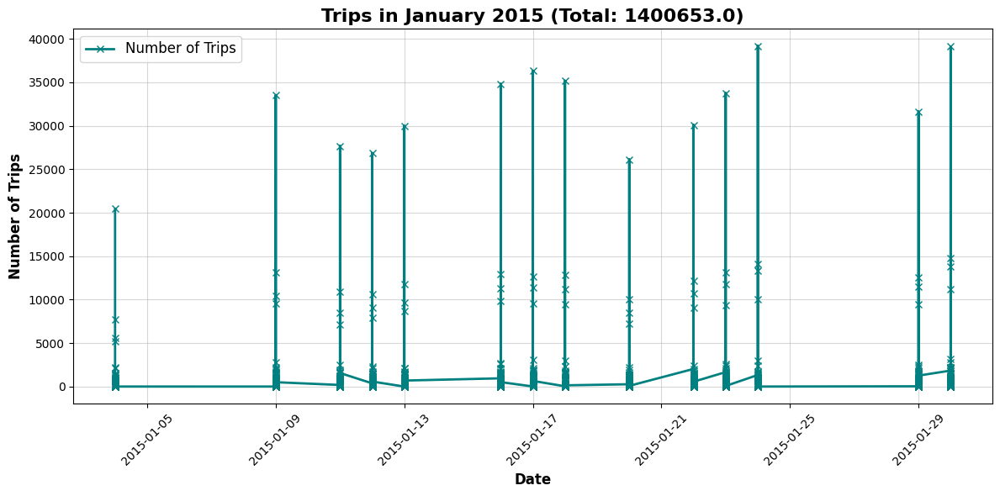

In [282]:
dimension_date['Date'] = pd.to_datetime(dimension_date['Date'])
fact_trips_vehicles['Pick Up Date'] = pd.to_datetime(fact_trips_vehicles['Pick Up Date'])

merged_data = pd.merge(dimension_date, fact_trips_vehicles, left_on='Date', right_on='Pick Up Date', how='inner')

# for Jan 2015
merged_data['Year_Month'] = merged_data['Date'].dt.to_period('M') 
january_data = merged_data[merged_data['Year_Month'] == '2015-01']

data = january_data[['Date', 'Number of Trips']].dropna()

data['Number of Trips'] = data['Number of Trips'].replace({',': ''}, regex=True).astype(float)


data_sorted = data.sort_values(by='Date')

total_trips = data_sorted['Number of Trips'].sum()

# Create Line Chart for Number of Trips with Seaborn styling
plt.figure(figsize=(12, 6))
plt.plot(data_sorted['Date'], data_sorted['Number of Trips'], marker='x',markerfacecolor='red', color='Teal', label='Number of Trips', linestyle='-', linewidth=2)
plt.title(f'Trips in January 2015 (Total: {total_trips})', fontsize=16, weight='bold')
plt.xlabel('Date', fontsize=12, weight='bold')
plt.ylabel('Number of Trips', fontsize=12, weight='bold')
plt.xticks(rotation=45)
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, alpha=0.5)
plt.tight_layout()
mplcursors.cursor(hover=True)

plt.show()


**--->>Creating Bar Chart On uber_raw_data_janjune_15 File Data**

In [300]:
uber_raw_data_janjune_15['day'].value_counts()

day
Saturday     2227660
Friday       2111389
Thursday     1985749
Sunday       1816566
Wednesday    1751009
Tuesday      1732528
Monday       1586651
Name: count, dtype: int64

<Axes: xlabel='day'>

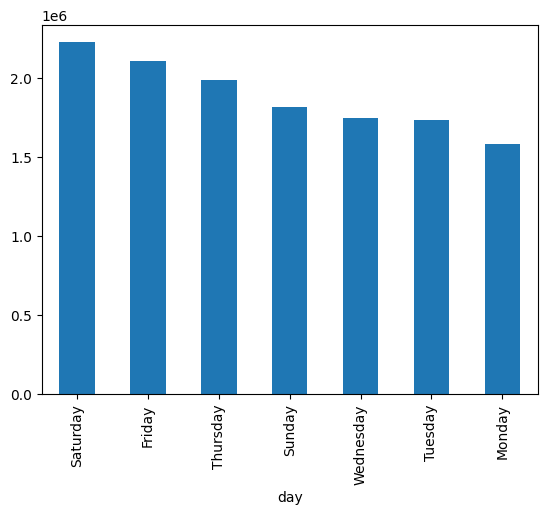

In [301]:
uber_raw_data_janjune_15['day'].value_counts().plot(kind ="bar")

In [302]:
uber_raw_data_janjune_15['month'].value_counts()

month
June        2571771
May         2483980
February    2141306
April       2112705
March       2062639
January     1839151
Name: count, dtype: int64

<Axes: xlabel='month'>

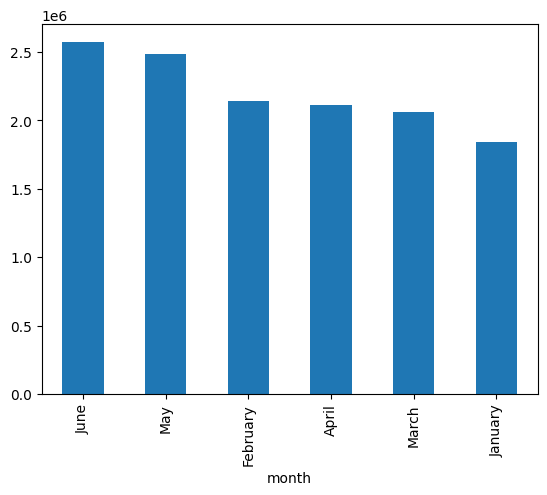

In [227]:
uber_raw_data_janjune_15['month'].value_counts().plot(kind = 'bar')

**Which Day has more demand day for Uber in 2015 jan-june**

In [303]:
demand_days_for_Uber = pd.crosstab(index = uber_raw_data_janjune_15['month'], columns=uber_raw_data_janjune_15['day']) #grouped bar plot using crosstab
demand_days_for_Uber

day,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,315002,238429,324545,273560,372522,250632,338015
February,360136,264693,354962,284432,323955,276956,276172
January,325261,182785,369693,219884,316857,188802,235869
June,371225,375312,399377,334434,357782,405500,328141
March,309631,269931,314785,313865,277026,320634,256767
May,430134,255501,464298,390391,337607,290004,316045


<Axes: xlabel='month'>

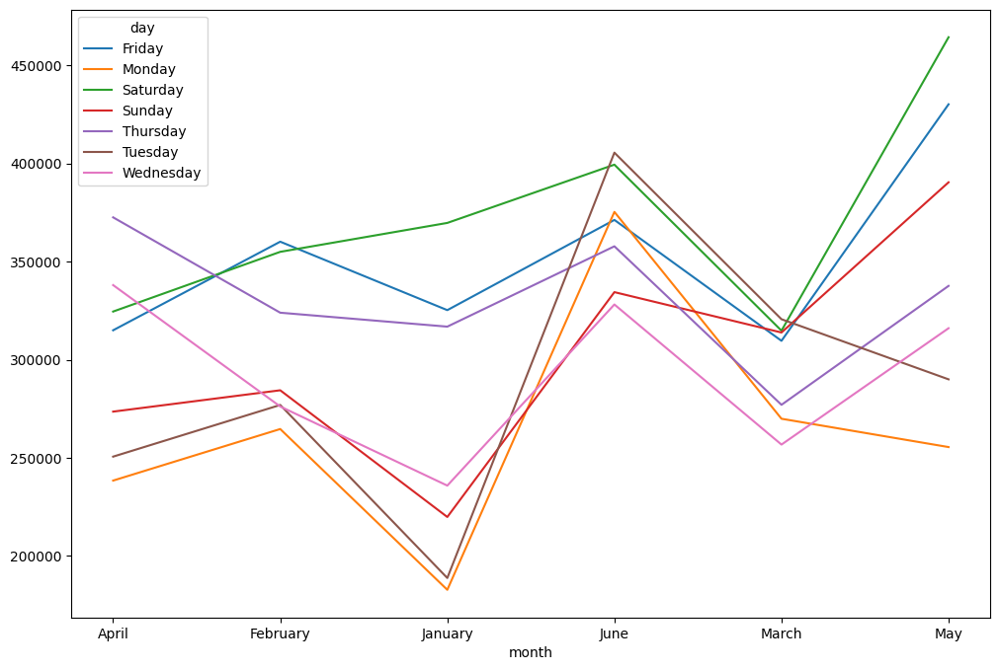

In [304]:
demand_days_for_Uber.plot(kind = 'line', figsize = (12,8))

<Axes: xlabel='month'>

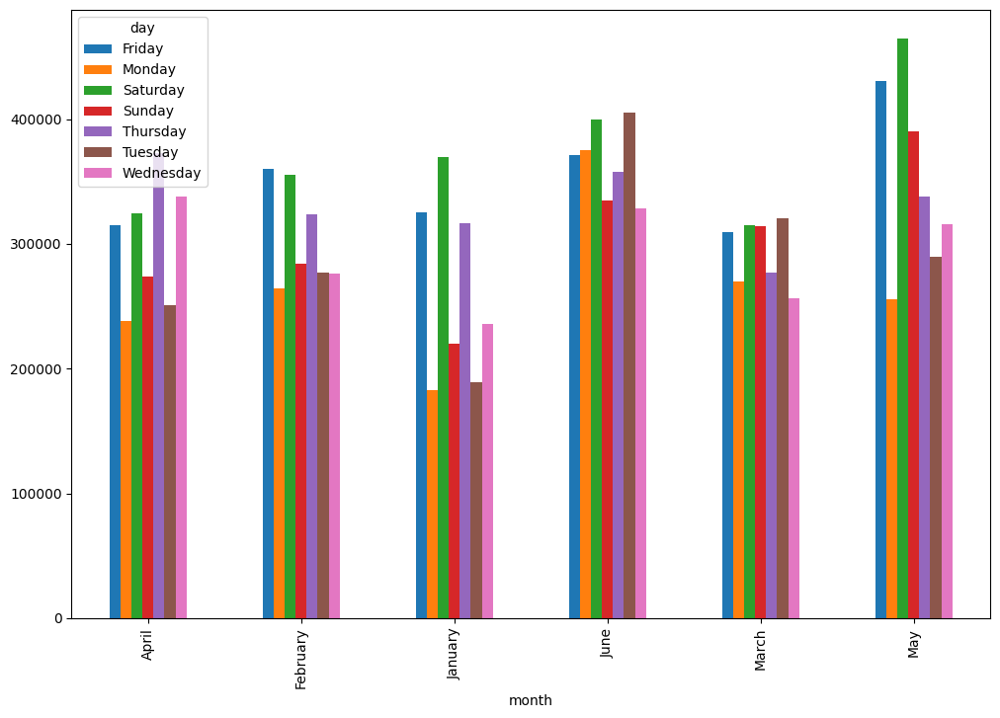

In [305]:
demand_days_for_Uber.plot(kind = 'bar', figsize = (12,8))

In [306]:
day_hours_summary = uber_raw_data_janjune_15.groupby(by = ['day','hours'], as_index= False).size()
day_hours_summary

,day,hours,size
0,Friday,0,78936
1,Friday,1,44064
2,Friday,2,26942
3,Friday,3,18845
4,Friday,4,22798
...,...,...,...
163,Wednesday,19,129724
164,Wednesday,20,122022
165,Wednesday,21,119511
166,Wednesday,22,113909


<Axes: xlabel='hours', ylabel='size'>

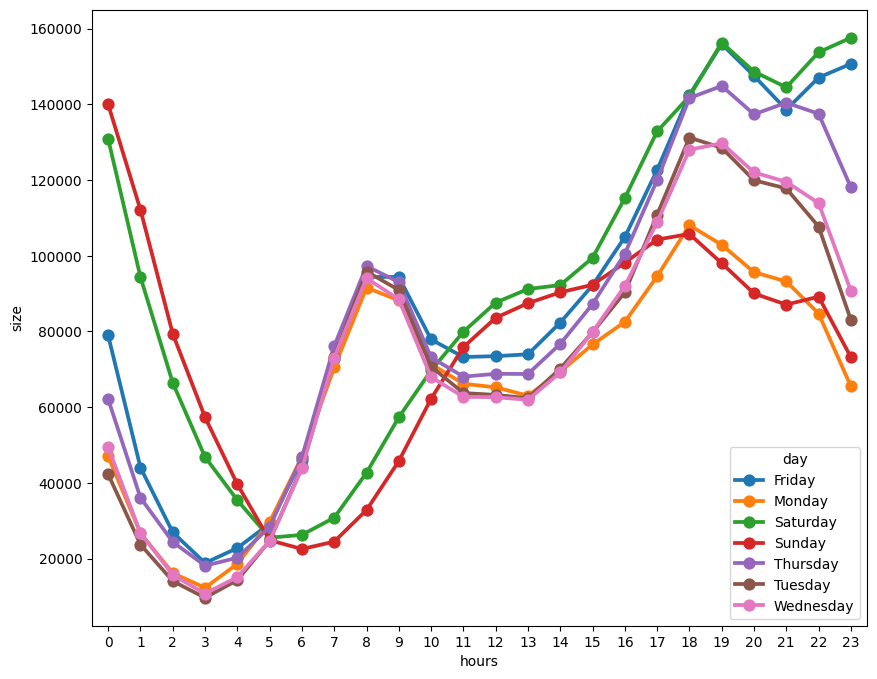

In [307]:
plt.figure(figsize=(10,8))
sns.pointplot(data = day_hours_summary, x = 'hours', y = 'size',hue='day')

**--->>Plotting the Scatter Chart Using the fact_trips_vehicles**

In [308]:
table_name = "fact_trips_vehicles"
x_column = "Pick Up Date"
y_column = "Number of Trips"

fact_trips_vehicles[y_column] = fact_trips_vehicles[y_column].astype(str).str.replace(",", "").str.strip().astype(int)

# Filtering the data for getting March 2015
filtered_data = fact_trips_vehicles[
    (fact_trips_vehicles[x_column] >= "2015-03-01") & 
    (fact_trips_vehicles[x_column] <= "2015-03-31")
]

aggregated_data = filtered_data.groupby(x_column)[y_column].sum().reset_index()


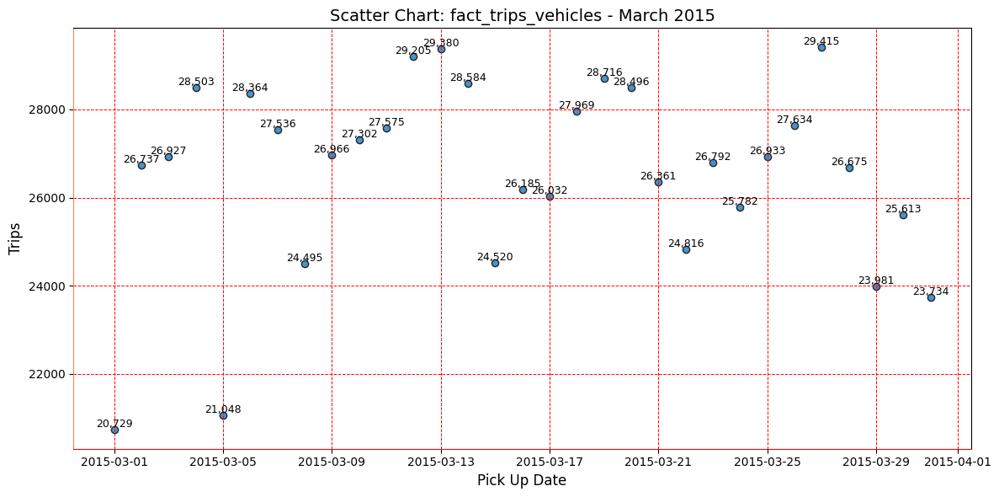

In [318]:
# Scatter plot
plt.figure(figsize=(12, 6))
plt.scatter(
    aggregated_data[x_column], 
    aggregated_data[y_column], 
    alpha=0.8,  
    edgecolors='black'
)

plt.title(f"Scatter Chart: {table_name} - March 2015", fontsize=14)
plt.xlabel("Pick Up Date", fontsize=12)
plt.ylabel("Trips", fontsize=12)

# Remove tick labels (values) from y-axis
    # plt.gca().set_yticklabels([])
    # plt.gca().set_xticklabels([])

for i, row in aggregated_data.iterrows():
    plt.text(
        row[x_column], 
        row[y_column], 
        f"{row[y_column]:,}",  # Format as an integer with thousands separator
        fontsize=9, 
        ha='center', 
        va='bottom', 
        color="black"
    )

plt.grid(True, color="red", linestyle="--", linewidth=0.7)

# Set face and edge colors
plt.gca().set_facecolor("#ffffff")  # Light cement-like background
plt.gca().spines['bottom'].set_color('red')
plt.gca().spines['left'].set_color('coral')

plt.tight_layout()  # Prevent label cut-offs
plt.show()


**--->>Creating Box Plot On Uber_Jan_Feb_FOIL file**

In [319]:
Uber_Jan_Feb_FOIL.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [320]:
Uber_Jan_Feb_FOIL.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

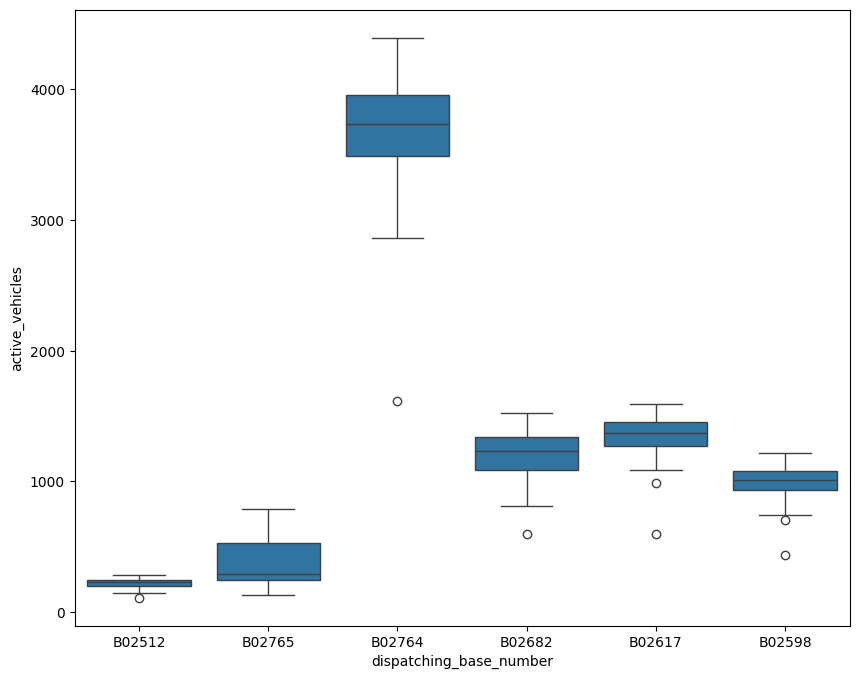

In [321]:
plt.figure(figsize= (10,8))
sns.boxplot(data = Uber_Jan_Feb_FOIL, x = 'dispatching_base_number', y = 'active_vehicles')
plt.show()

**--->>Lets prepare data for Months of 2014**

In [322]:
filenames = ["uber-raw-data-apr14.csv","uber-raw-data-aug14.csv","uber-raw-data-jul14.csv","uber-raw-data-jun14.csv","uber-raw-data-may14.csv","uber-raw-data-sep14.csv"]

raw_data = []

for fname in filenames:
    df = pd.read_csv(fname)
    raw_data.append(df)

final_raw_data = pd.concat(raw_data,ignore_index = True)
final_raw_data

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
4534322,9/30/2014 22:57:00,40.7668,-73.9845,B02764
4534323,9/30/2014 22:57:00,40.6911,-74.1773,B02764
4534324,9/30/2014 22:58:00,40.8519,-73.9319,B02764
4534325,9/30/2014 22:58:00,40.7081,-74.0066,B02764


In [323]:
final_raw_data.shape

(4534327, 4)

In [324]:
final_raw_data.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [325]:
final_raw_data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [326]:
final_raw_data.tail()

,Date/Time,Lat,Lon,Base
4534322,9/30/2014 22:57:00,40.7668,-73.9845,B02764
4534323,9/30/2014 22:57:00,40.6911,-74.1773,B02764
4534324,9/30/2014 22:58:00,40.8519,-73.9319,B02764
4534325,9/30/2014 22:58:00,40.7081,-74.0066,B02764
4534326,9/30/2014 22:58:00,40.7140,-73.9496,B02764


In [327]:
final_raw_data.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [328]:
final_raw_data.duplicated().sum()

np.int64(82581)

In [329]:
final_raw_data.drop_duplicates(inplace = True)

In [330]:
final_raw_data.duplicated().sum()

np.int64(0)

**--->>Analysing Maximum Uber Pickups by Locations**

In [331]:
lat_lan_group = final_raw_data.groupby(['Lat','Lon'],as_index = False).size()   #as_index = False makes the attribute size() as its index name
lat_lan_group

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,1


In [332]:
basemap = folium.Map()
basemap

In [333]:
from folium.plugins import HeatMap

In [334]:
HeatMap(lat_lan_group).add_to(basemap)

In [335]:
basemap

In [336]:
final_raw_data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


**Visualizing uber pick ups based on each hour on weekdays**

In [337]:
final_raw_data['Date/Time'] = pd.to_datetime(final_raw_data['Date/Time'], format= "%m/%d/%Y %H:%M:%S")

In [339]:
final_raw_data['Day'] = final_raw_data['Date/Time'].dt.day
final_raw_data['Month'] = final_raw_data['Date/Time'].dt.month
final_raw_data['Hour'] = final_raw_data['Date/Time'].dt.hour

In [340]:
final_raw_data.head()

,Date/Time,Lat,Lon,Base,Day,Month,Hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,4,0


In [341]:
pivot_table = final_raw_data.groupby(['Day','Hour']).size().unstack()
pivot_table

Hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Day,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,...,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,...,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,...,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,...,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,...,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,...,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,...,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,...,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,...,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [343]:
pivot_table.style.background_gradient()

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [344]:
pivot_table.style.background_gradient(cmap='coolwarm')

Hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
Day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


**--->>Using the same raw rata files in different way**

In [345]:
uber2014.head()

,Count
Date,
2014-04-01 00:00:00,138
2014-04-01 01:00:00,66
2014-04-01 02:00:00,53
2014-04-01 03:00:00,93
2014-04-01 04:00:00,166


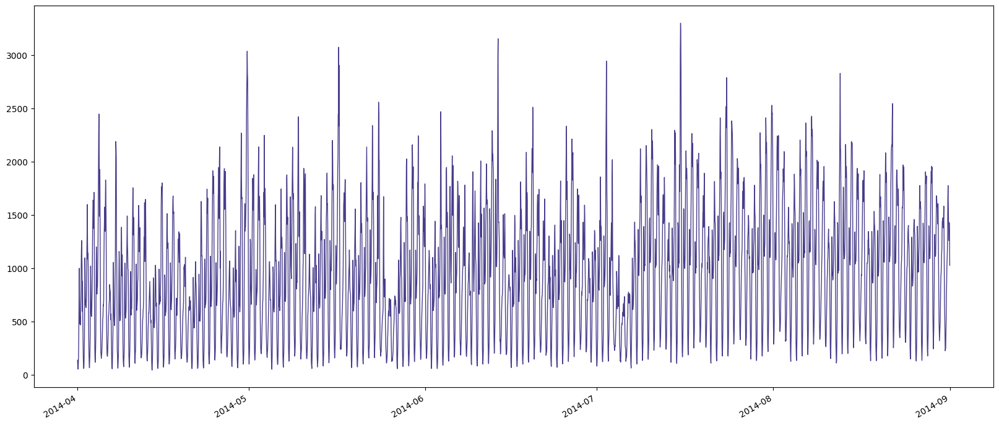

In [347]:
plt.figure(figsize=(20, 8))
plt.plot(uber2014['Count'],linewidth = 1, color='darkslateblue')
plt.xticks(rotation=30,ha='right')
plt.show()

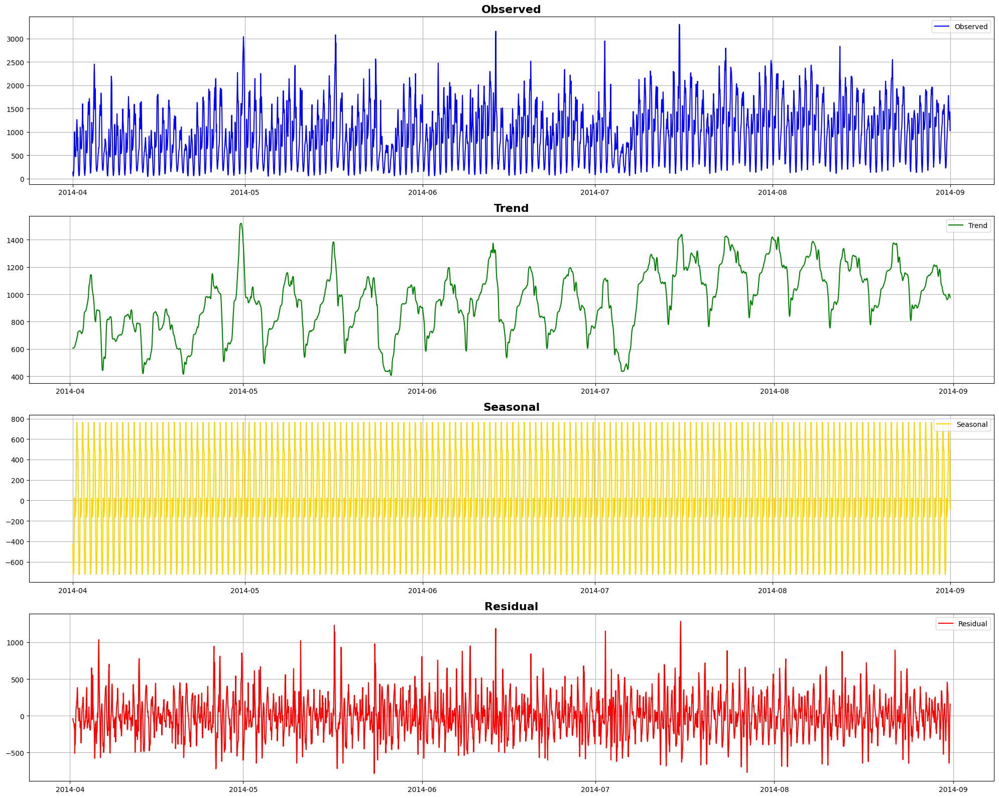

In [348]:
result = seasonal_decompose(uber2014['Count'], model='add', period=24)

plt.figure(figsize=(20, 16))  

# Observed
plt.subplot(4, 1, 1)
plt.plot(result.observed, label='Observed', color='blue')
plt.title('Observed', fontsize=16, weight='bold')
plt.grid(True)
plt.legend()

# Trend
plt.subplot(4, 1, 2)
plt.plot(result.trend, label='Trend', color='green')
plt.title('Trend', fontsize=16, weight='bold')
plt.grid(True)
plt.legend()

# Seasonal
plt.subplot(4, 1, 3)
plt.plot(result.seasonal, label='Seasonal', color='Gold')
plt.title('Seasonal', fontsize=16, weight='bold')
plt.grid(True)
plt.legend()

# Residual
plt.subplot(4, 1, 4)
plt.plot(result.resid, label='Residual', color='red')
plt.title('Residual', fontsize=16, weight='bold')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


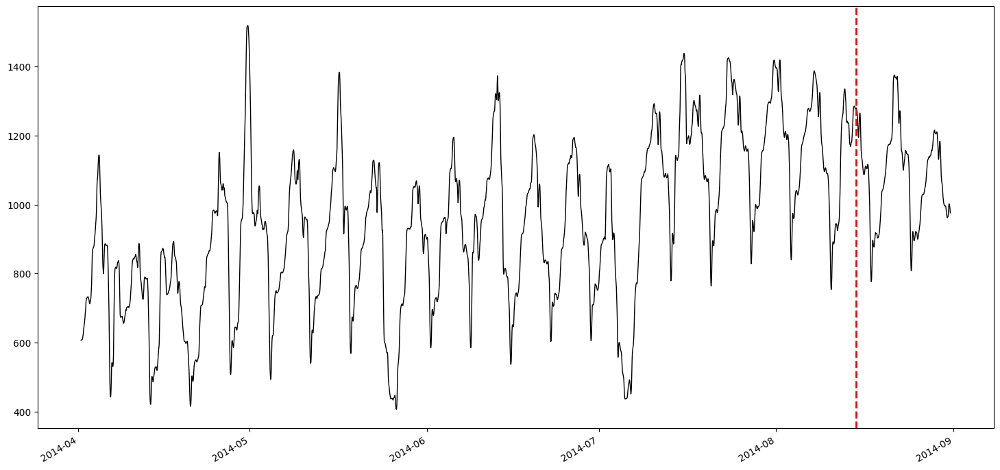

In [349]:
cutoff_date = '2014-08-15 00:00:00' #This is defining a specific cutoff date, you can change this
plt.figure(figsize=(18, 8))
plt.plot(result.trend,linewidth = 1, color='black')
plt.axvline(x=pd.Timestamp(cutoff_date), color='red', linestyle='--', linewidth=2)
plt.xticks(rotation=30,ha='right')
plt.show()

As seen above, the trend stays relatively stable until around September 2014, and then increases to 4 more peaks. Leaving up to the first 2 peaks as train data and the remaining 2 as test would be sufficient. This is particularly important, because if we did the usual 80/20 split, we would likely encounter errors due to the said trend increase.

In [350]:
uber2014_train = uber2014.loc[:cutoff_date]
uber2014_test = uber2014.loc[cutoff_date:]

<Axes: title={'center': 'Train / Test Sets'}, xlabel='Date'>

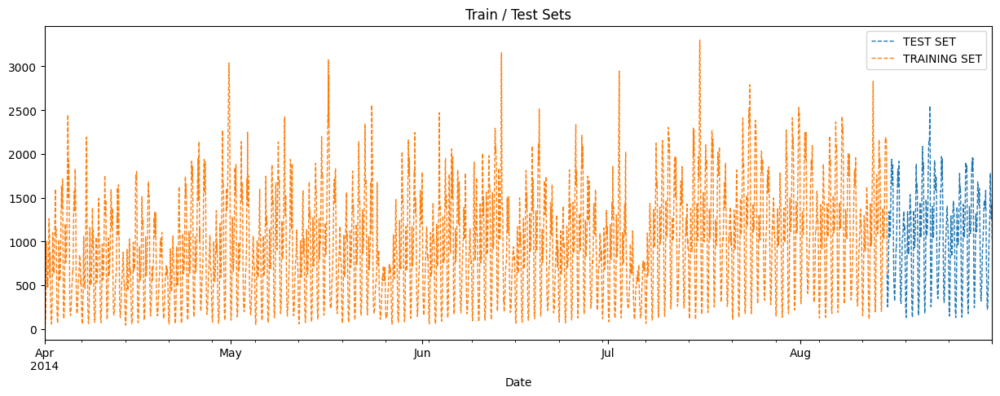

In [353]:
uber2014_test.rename(columns={'Count':'TEST SET'}).join(uber2014_train.rename(columns={'Count':'TRAINING SET'}), how='outer').plot(figsize=(15,5), title='Train / Test Sets', style='--', lw=1)

**--->>Set the Window Size**

In [354]:
window_size = 24

In [355]:
def create_lagged_features(data, window_size):

    X, y = [], []
    for i in range(window_size, len(data)):
        X.append(data[i-window_size:i])  # Lagged values
        y.append(data[i])  # Current value
    return np.array(X), np.array(y)

X_train, y_train = create_lagged_features(uber2014_train['Count'].values, window_size)


In [356]:
X_train, y_train = create_lagged_features(uber2014_train['Count'].values, window_size)

In [357]:
test_data = np.concatenate([uber2014_train['Count'].values[-window_size:], uber2014_test['Count'].values])
X_test, y_test = create_lagged_features(test_data, window_size)

In [358]:
seed = 12345 # sets a random seed for generating random numbers

### Machine Learning Models

**Random Forest model**\
Finally, Random Forests are less susceptible to overfitting, however (again, in my experience) don't usually perform better than XGB

In [359]:
uber2014.head()

,Count
Date,
2014-04-01 00:00:00,138
2014-04-01 01:00:00,66
2014-04-01 02:00:00,53
2014-04-01 03:00:00,93
2014-04-01 04:00:00,166


In [360]:
uber2014.dtypes

Count    int64
dtype: object

In [361]:
print(uber2014.index.min())  # Earliest date in the dataset
print(uber2014.index.max())  # Latest date in the dataset


2014-04-01 00:00:00
2014-08-31 23:00:00


In [362]:
split_ratio = 0.9  
split_point = int(len(uber2014) * split_ratio)
train = uber2014.iloc[:split_point]
test = uber2014.iloc[split_point:]

print("Length of train:", len(train))
print("Length of test:", len(test))

def create_lagged_features(series, window_size):
    X, y = [], []
    if len(series) > window_size:
        for i in range(len(series) - window_size):
            X.append(series[i:i+window_size])
            y.append(series[i+window_size])
    return np.array(X), np.array(y)

window_size = 24

X_train, y_train = create_lagged_features(train['Count'].values, window_size)

test_series = np.concatenate([train['Count'].values[-window_size:], test['Count'].values])
X_test, y_test = create_lagged_features(test_series, window_size)

if X_train.ndim == 1:
    X_train = X_train.reshape(-1, 1)
if X_test.ndim == 1:
    X_test = X_test.reshape(-1, 1)

rf_model = RandomForestRegressor(
    n_estimators=200,
    max_depth=20,
    min_samples_split=5,
    random_state=42
)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)

print(f"Random Forest MAPE: {mean_absolute_percentage_error(y_test, rf_predictions):.2%}")


Length of train: 3304
Length of test: 368
Random Forest MAPE: 6.92%


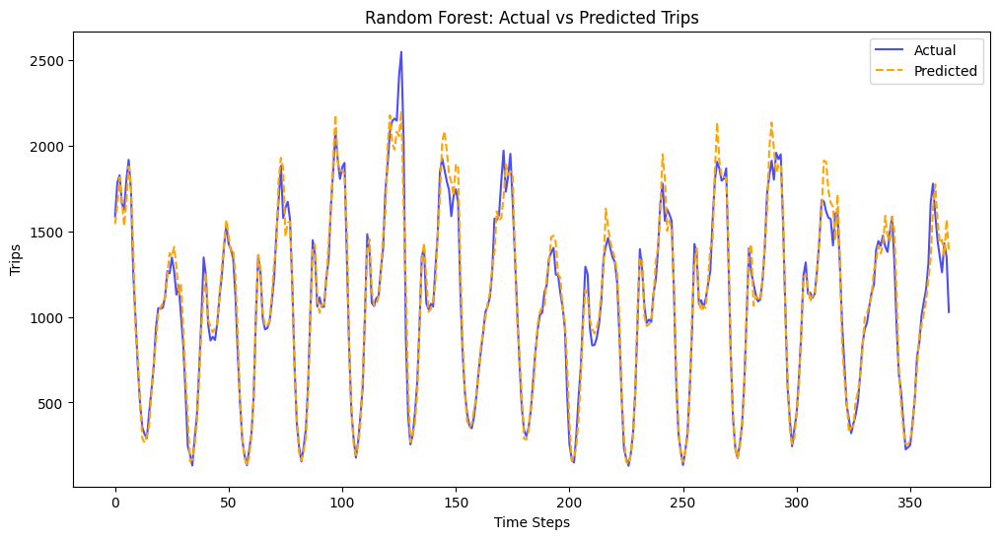

Random Forest MAPE: 6.92%


In [363]:
def plot_predictions(y_test, predictions, title):
    plt.figure(figsize=(12, 6))
    plt.plot(range(len(y_test)), y_test, label='Actual', color='blue', alpha=0.7)
    plt.plot(range(len(predictions)), predictions, label='Predicted', color='orange', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Steps')
    plt.ylabel('Trips')
    plt.legend()
    plt.show()

plot_predictions(y_test, rf_predictions, "Random Forest: Actual vs Predicted Trips")

print(f"Random Forest MAPE: {mean_absolute_percentage_error(y_test, rf_predictions):.2%}")


**Gradient Boosted Regression Tree model**

In [364]:
# Gradient Boosted Regressor Model
gbr_model = GradientBoostingRegressor(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=5,
    random_state=42
)
gbr_model.fit(X_train, y_train)
gbr_predictions = gbr_model.predict(X_test)

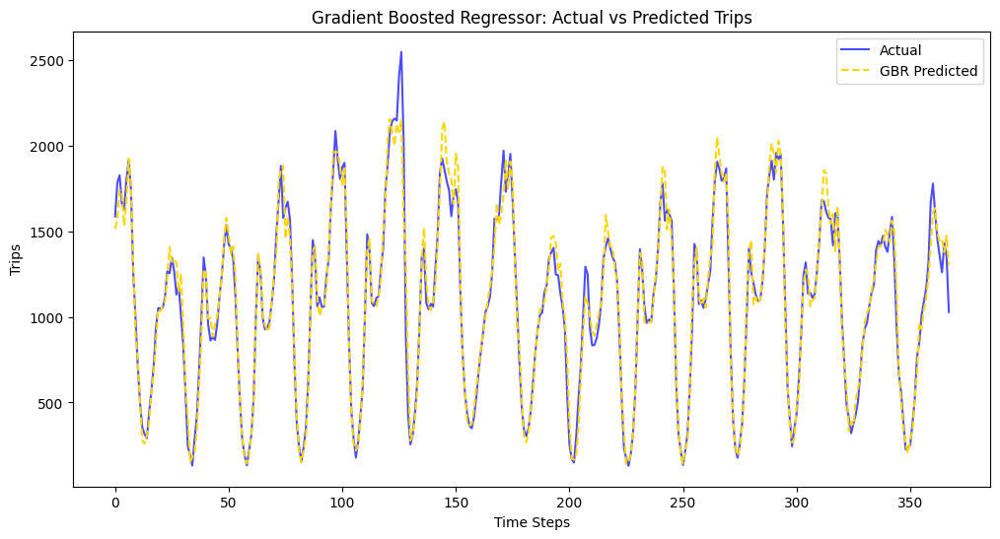

Gradient Boosted Regressor MAPE: 7.26%


In [367]:
# Plot Actual vs Predicted Values for GBR
def plot_gbr_predictions(y_test, gbr_predictions):
    plt.figure(figsize=(12, 6))
    plt.plot(range(len(y_test)), y_test, label='Actual', color='blue', alpha=0.7)
    plt.plot(range(len(gbr_predictions)), gbr_predictions, label='GBR Predicted', color='gold', linestyle='--')
    plt.title("Gradient Boosted Regressor: Actual vs Predicted Trips")
    plt.xlabel('Time Steps')
    plt.ylabel('Trips')
    plt.legend()
    plt.show()

plot_gbr_predictions(y_test, gbr_predictions)

print(f"Gradient Boosted Regressor MAPE: {mean_absolute_percentage_error(y_test, gbr_predictions):.2%}")


**Ensemble Model**\
Building the ensemble requires to understand how each algorithm has performed individually first. Then, decide how we can leverage each one's strenghts to our advantage.

In [368]:
weights = np.array([1 / mean_absolute_percentage_error(y_test, rf_predictions),
                    1 / mean_absolute_percentage_error(y_test, gbr_predictions)])
weights /= weights.sum()  # Normalize weights
ensemble_predictions = (weights[0] * rf_predictions +
                        weights[1] * gbr_predictions)

In [369]:
print(f"Ensemble MAPE: {mean_absolute_percentage_error(y_test, ensemble_predictions):.2%}")

Ensemble MAPE: 6.90%


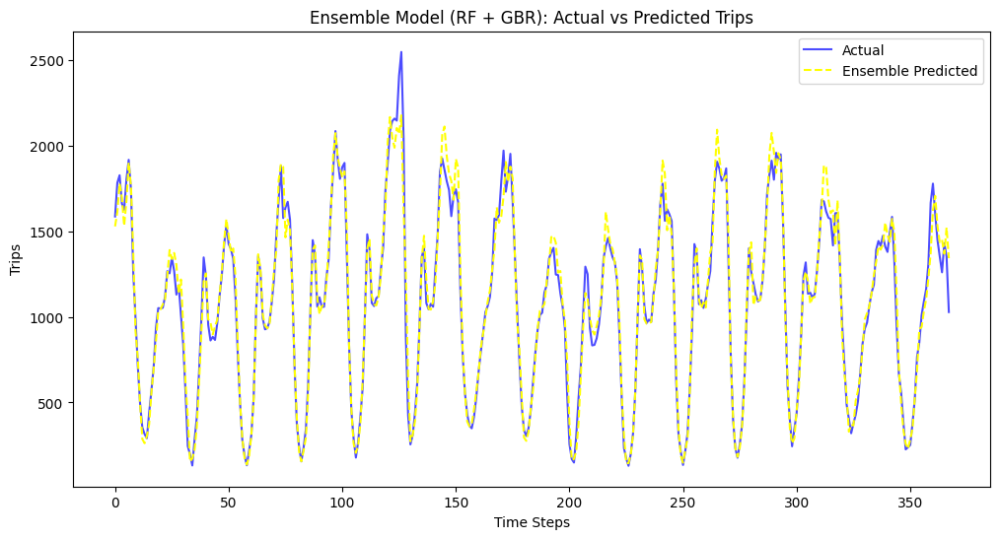

Ensemble MAPE: 6.90%


In [372]:
# Visualization for the Ensemble Model
def plot_ensemble_predictions(y_test, ensemble_predictions):
    plt.figure(figsize=(12, 6))
    plt.plot(range(len(y_test)), y_test, label='Actual', color='blue', alpha=0.7)
    plt.plot(range(len(ensemble_predictions)), ensemble_predictions, label='Ensemble Predicted', color='yellow', linestyle='--')
    plt.title("Ensemble Model (RF + GBR): Actual vs Predicted Trips")
    plt.xlabel('Time Steps')
    plt.ylabel('Trips')
    plt.legend()
    plt.show()

plot_ensemble_predictions(y_test, ensemble_predictions)
print(f"Ensemble MAPE: {mean_absolute_percentage_error(y_test, ensemble_predictions):.2%}")

### Mean Absolute Percentage Error(MAPE) of all Models

In [373]:
print(f"Random Forest MAPE: {mean_absolute_percentage_error(y_test, rf_predictions):.2%}")
print(f"Gradient Boosted Regressor MAPE: {mean_absolute_percentage_error(y_test, gbr_predictions):.2%}")
print(f"Ensemble MAPE: {mean_absolute_percentage_error(y_test, ensemble_predictions):.2%}")

Random Forest MAPE: 6.92%
Gradient Boosted Regressor MAPE: 7.26%
Ensemble MAPE: 6.90%


## Insights and Conclusions from Training and Evaluation¶


**Model Performance Overview:**

***Random Forest:*** Recorded a MAPE of 6.92%, showing good performance. This model effectively utilizes the window-based logic to capture time-dependent variations in the data.\
***Gradient Boosted Tree Regressor (GBTR):*** Achieved a MAPE of 7.26%, indicating reasonable performance, although it does not match the effectiveness of XGBoost or Random Forest.\
***Ensemble Model:***
The ensemble model achieved a MAPE of 6.90%, which is an improvement over both Random Forest and GBTR. This performance showcases the ensemble's ability to integrate the strengths of the individual models while providing robust and stable predictions.
The ensemble combines predictions from XGBoost, Random Forest, and GBTR, capitalizing on the complementary strengths of each model.

**Impact of Window-Based Logic:**

* Applying window-based logic to model training has effectively captured temporal dependencies in the data, resulting in enhanced predictive accuracy across all models.
* This approach ensures that the models can better handle seasonality and trends, which is crucial for accurate time series forecasting, particularly in dynamic contexts like ride-sharing demand.

**Cross-Validation and Parameter Tuning:**
* Cross-validation has provided a reliable assessment of model performance in temporal contexts, ensuring robustness and reducing the risk of overfitting.
* Parameter tuning, particularly for XGBoost and GBTR, has likely contributed to their strong performances, reflecting effective optimization efforts.

**Practical Implications:**
* For practical applications, XGBoost is recommended for scenarios where achieving the lowest error is critical due to its superior MAPE.
* The ensemble model serves as a strong alternative, providing improved predictive performance over the individual models, particularly useful for scenarios requiring stability and reliability.